In [1]:
pip install autograd

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn import  linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import make_pipeline
from sklearn.utils import resample
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from sklearn.model_selection import GridSearchCV
import math as ma
from sklearn.model_selection import GridSearchCV
import seaborn as sns
import autograd.numpy as np

# To do elementwise differentiation:
from autograd import elementwise_grad as egrad 
from autograd import grad

In [3]:
#Functions for R2 and MSE
np.random.seed(644)
def R2(y_data, y_model):
    return 1 - np.sum((y_data - y_model) ** 2) / np.sum((y_data - np.mean(y_data)) ** 2)
def MSE(y_data,y_model):
    n = np.size(y_model)
    return np.sum((y_data-y_model)**2)/n

In [4]:
def noiseGeneration(z_input, scaling = 0.1):
    np.random.seed(644)
    
    nosyZ= z_input + np.random.randn(*z_input.shape) * scaling
    return nosyZ

In [5]:
def Hessian_eta_ols (X,n):
    H = (2.0/n)* X.T @ X
    EigValues, EigVectors = np.linalg.eig(H)
    eta = 1.0/np.max(EigValues)
    return eta
    

In [6]:
 def grad_descent_ols(X_train,y_train,eta):
        np.random.seed(644)
        itter = 0
        beta = np.random.randn(X_train.shape[1]) # Picking out initial beta values. 
        gradient_n = 0
        converge_criteria = 20 #some intial value
        while converge_criteria > 1e-8:
            dc_db = (2.0/len(X_train))*X_train.T @ (X_train @ beta - y_train) # derivative of the cost function gradient_n+1
            converge_criteria = np.linalg.norm(dc_db-gradient_n)
            gradient_n = dc_db #gradient n-1
            beta = beta - eta*dc_db
            itter += 1
        theta_gd = beta
        ytilde_gd = X_train @ theta_gd
        mse_train = mean_squared_error(y_train, ytilde_gd)
        return theta_gd,itter

In [7]:
def momentum_GD_OLS(X_train,y_train,eta,gamma = 0.9):
    np.random.seed(644)
    v_initial  = 0
    beta = np.random.randn(X_train.shape[1]) # Picking out initial beta values.
    itter = 0 # number of itterations needed to converge
    gradient_n = 0 #some inital value
    converge_criteria = 20 # some inital value
    while converge_criteria > 1e-8:
        dc_db = (2.0/len(X_train))*X_train.T @ (X_train @ beta - y_train) # derivative of the cost function gradient_n
        gradient_n = dc_db #gradient n-1
        v_vector = gamma*v_initial + eta*dc_db
        beta = beta - v_vector
        converge_criteria = np.linalg.norm(v_vector-v_initial)
        v_initial = v_vector
        itter += 1
    theta_moment = beta
    return theta_moment,itter
        


In [8]:
def X_generator(x, y, n):
    if len(x.shape) > 1:
        x = np.ravel(x)
        y = np.ravel(y)

    N = len(x)
    l = int((n+1)*(n+2)/2)  # Number of elements in beta
    X = np.ones((N,l))

    for i in range(1,n+1):
        q = int((i)*(i+1)/2)
        for k in range(i+1):
            X[:,q+k] = (x**(i-k))*(y**k)

    return X

In [9]:
# Franke Function
def FrankeFunction(x,y):
    term1 = 0.75*np.exp(-(0.25*(9*x-2)**2) - 0.25*((9*y-2)**2))
    term2 = 0.75*np.exp(-((9*x+1)**2)/49.0 - 0.1*(9*y+1))
    term3 = 0.5*np.exp(-(9*x-7)**2/4.0 - 0.25*((9*y-3)**2))
    term4 = -0.2*np.exp(-(9*x-4)**2 - (9*y-7)**2)
    return term1 + term2 + term3 + term4

In [10]:
# split in training and test data
def traningDataGenerator(X,z):
    X_train, X_test, y_train, y_test = train_test_split(X,z,test_size=0.2, random_state= 11)
    return X_train, X_test, y_train, y_test

In [11]:
#Scaling function for the feature matrix
def scale(X_train,X_test,y_train,y_test):
    scaler = StandardScaler(with_std=True)
    scaler_x = scaler.fit(X_train) # Scaling x-data
    X_train_scaled = scaler_x.transform(X_train)
    X_test_scaled = scaler_x.transform(X_test)
    
    
    #scaler_y = np.mean(y_train)
    #y_train_scaled = y_train - scaler_y
    #y_test_scaled = y_test - scaler_y
    scaler_y = scaler.fit(y_train.reshape(-1,1))
    y_train_scaled = scaler_y.transform(y_train.reshape(-1,1)).ravel()
    y_test_scaled = scaler_y.transform(y_test.reshape(-1,1)).ravel()
    return X_train_scaled,X_test_scaled,y_train_scaled,y_test_scaled

In [12]:
def plot_z(x,y,z,title):
    from mpl_toolkits.mplot3d import Axes3D
    from matplotlib import cm
    from matplotlib.ticker import LinearLocator, FormatStrFormatter
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    surf = ax.plot_surface(x_mesh, y_mesh, z, cmap=cm.coolwarm,linewidth=0, antialiased=False)
    # Customize the z axis.
    ax.set_zlim(-0.10, 1.40)
    ax.zaxis.set_major_locator(LinearLocator(10))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    # Add a color bar which maps values to colors.
    fig.colorbar(surf, shrink=0.5, aspect=5)
    plt.title("{}".format(title))
    plt.show()

In [13]:
x = np.linspace(0,1,20)
y = np.linspace(0,1,20)
x_mesh,y_mesh = np.meshgrid(x,y)
x_flat = x_mesh.ravel()
y_flat = y_mesh.ravel()

z = FrankeFunction(x_flat,y_flat)

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


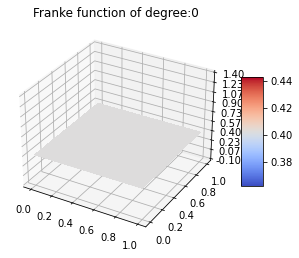

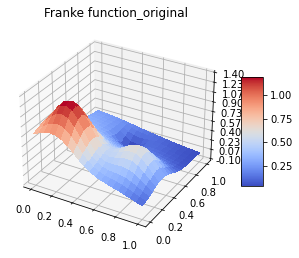

runde0


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


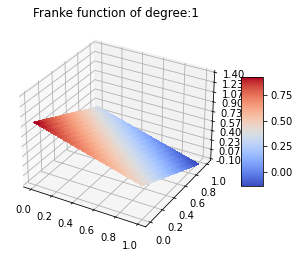

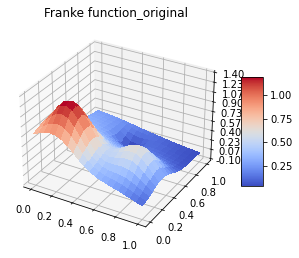

runde1


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


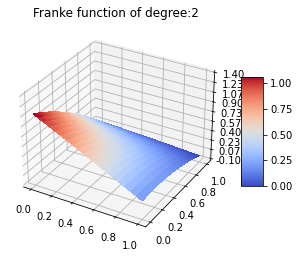

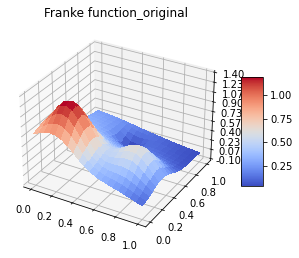

runde2


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


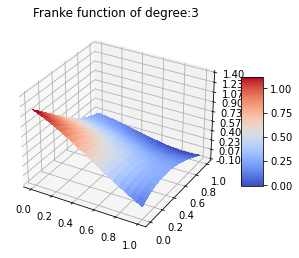

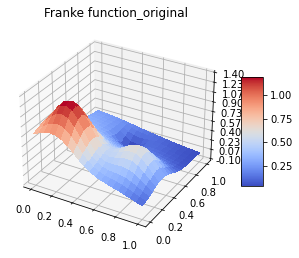

runde3


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


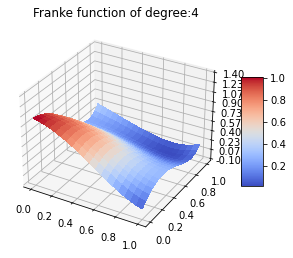

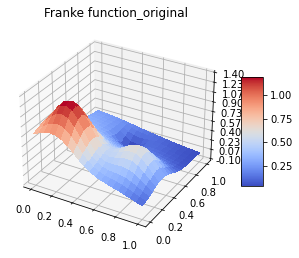

runde4


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


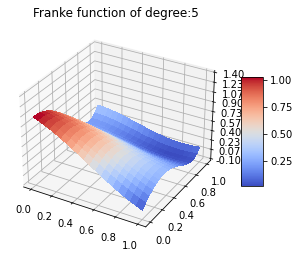

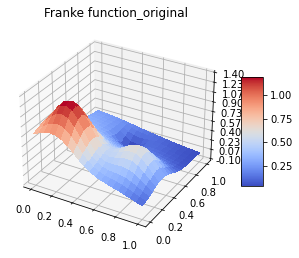

runde5


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


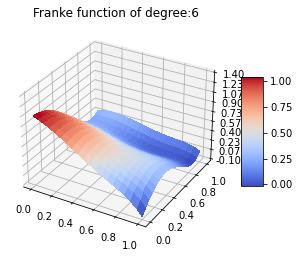

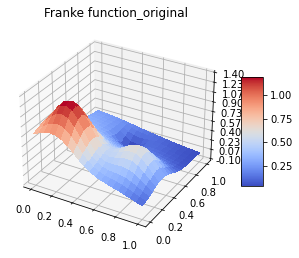

runde6


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


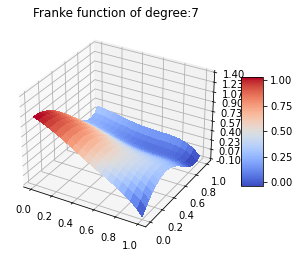

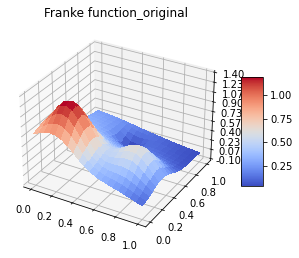

runde7


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


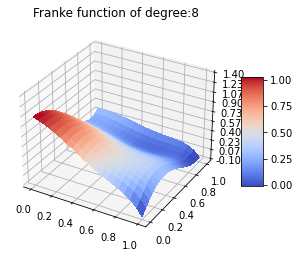

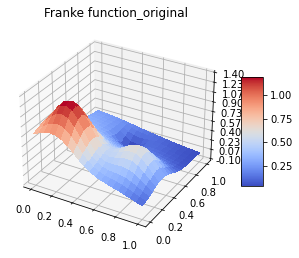

runde8


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


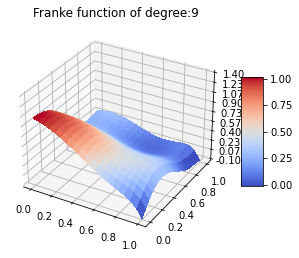

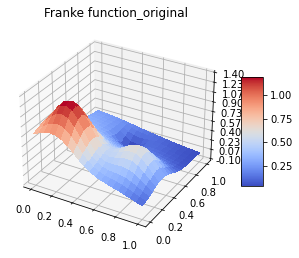

runde9


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


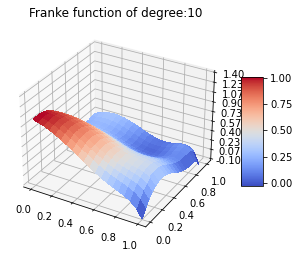

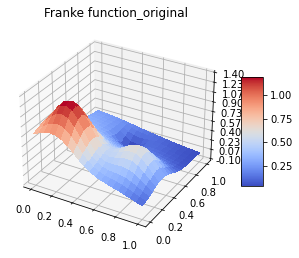

runde10


In [14]:

mse_gd_itter = []
mse_gd_poly = []
mse_gd_poly_train = []
theta = []
theta_i = 0
z_mesh = FrankeFunction(x_mesh,y_mesh)
z = FrankeFunction(x_flat,y_flat)
z = noiseGeneration(z)
itterations_olsgd_plain = []
max_degree = 10
for i in range(0, max_degree + 1):
    X = X_generator(x_flat,y_flat,i)
    eta = Hessian_eta_ols(X,len(X[1]))
    X_train,X_test,z_train,z_test = traningDataGenerator(X,z)
    theta_i,itter_n = grad_descent_ols(X_train,z_train,eta)
    theta.append(theta_i)
    itterations_olsgd_plain.append(itter_n)
    z_pred_ols = X_test @ theta_i
    z_tilde_ols = X_train @ theta_i
    mse_gd_poly.append(mean_squared_error(z_test,z_pred_ols))
    mse_gd_poly_train.append(mean_squared_error(z_train,z_tilde_ols))
    z_plot = X @ theta_i
    z_plot = z_plot.reshape(z_mesh.shape)
    plot_z(x_mesh,y_mesh,z_plot,"Franke function of degree:{}".format(i))
    plot_z(x_mesh,y_mesh,z_mesh,"Franke function_original")
    print("runde{}".format(i))
    
    
    



    

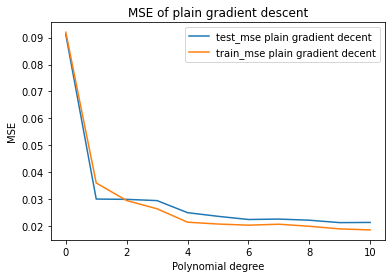

In [15]:
plt.plot(np.arange(0,max_degree + 1), mse_gd_poly, label='test_mse plain gradient decent')
plt.plot(np.arange(0,max_degree +1), mse_gd_poly_train, label='train_mse plain gradient decent')
plt.legend()
plt.xlabel("Polynomial degree")
plt.ylabel("MSE")
plt.title("MSE of plain gradient descent")
plt.show()







C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


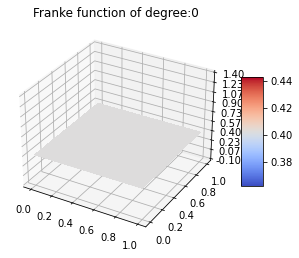

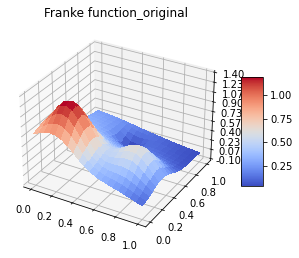

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


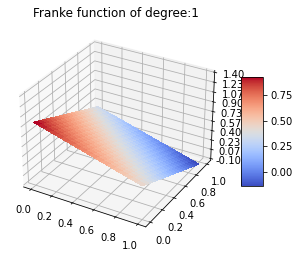

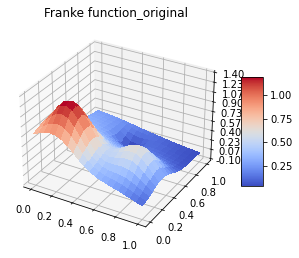

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


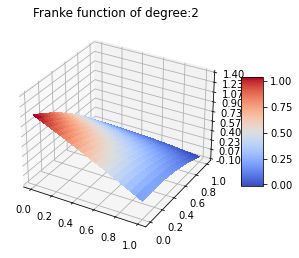

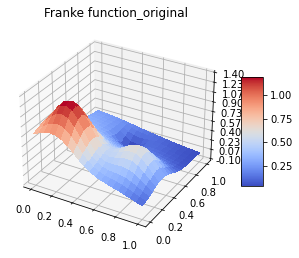

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


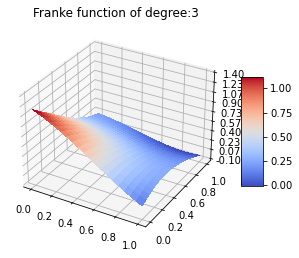

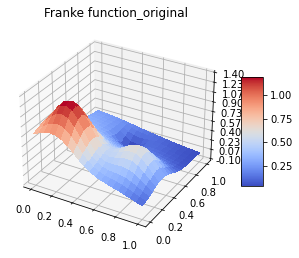

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


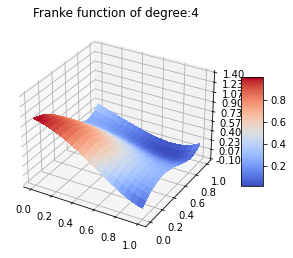

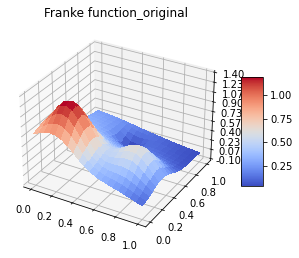

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


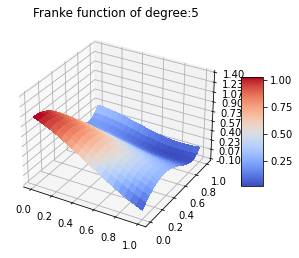

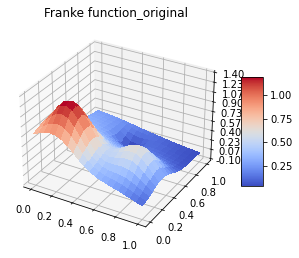

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


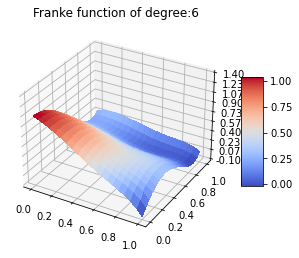

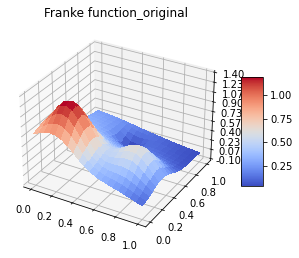

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


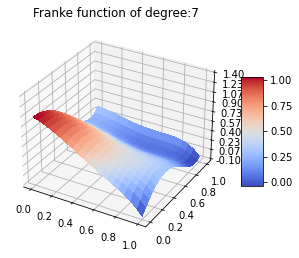

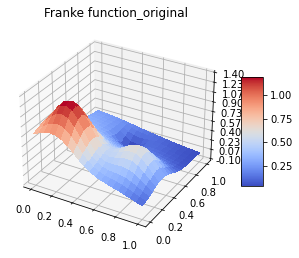

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


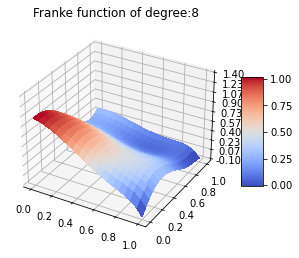

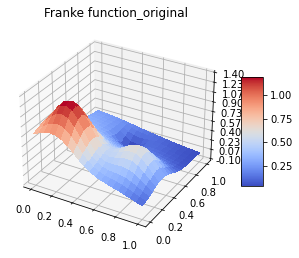

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


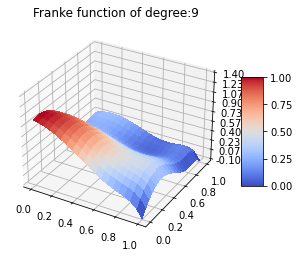

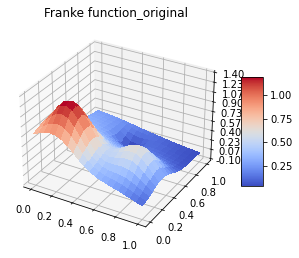

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


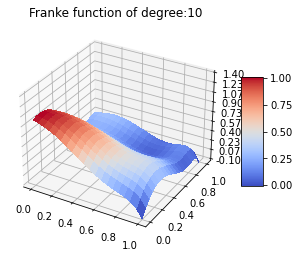

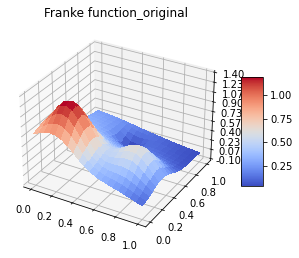

0.024104622869949074


In [16]:
mse_gd_itter = []
mse_gd_poly_moment = []
mse_gd_poly_train_moment = []
theta_moment_ols = []
theta_i = 0
itter_i = 0
itterations_GDols_momentum = []
z_mesh = FrankeFunction(x_mesh,y_mesh)
z = FrankeFunction(x_flat,y_flat)
z = noiseGeneration(z)
max_degree = 10
for i in range(0, max_degree + 1):
    X = X_generator(x_flat,y_flat,i)
    eta = Hessian_eta_ols(X,len(X[1]))
    X_train,X_test,z_train,z_test = traningDataGenerator(X,z)
    
    theta_i,itter_i = momentum_GD_OLS(X_train,z_train,eta)
    theta_moment_ols.append(theta_i)
    itterations_GDols_momentum.append(itter_i)
    z_pred_ols = X_test @ theta_i
    z_tilde_ols = X_train@ theta_i
    mse_gd_poly_moment.append(mean_squared_error(z_test,z_pred_ols))
    mse_gd_poly_train_moment.append(mean_squared_error(z_train,z_tilde_ols))
    z_plot = X @ theta_i
    z_plot = z_plot.reshape(z_mesh.shape)
    plot_z(x_mesh,y_mesh,z_plot,"Franke function of degree:{}".format(i))
    plot_z(x_mesh,y_mesh,z_mesh,"Franke function_original")
print(eta)
df_Gd_hessian = pd.DataFrame({"GD MSE moment":mse_gd_poly_moment,"converg itter_moment":itterations_GDols_momentum,\
                              "plain GD MSE":mse_gd_poly,"converg itter_plain":itterations_olsgd_plain})

In [17]:
df_Gd_hessian

,GD MSE moment,converg itter_moment,plain GD MSE,converg itter_plain
0,0.091164,336,0.091164,5510
1,0.029961,2643,0.029970,31865
2,0.028858,10736,0.029852,149211
3,0.029484,6676,0.029390,76748
4,0.025270,9977,0.024905,126163
5,0.023550,13116,0.023550,131234
6,0.022280,10636,0.022362,98969
7,0.022322,8624,0.022523,75449
8,0.021243,11511,0.022099,68935
9,0.020937,14202,0.021205,74957


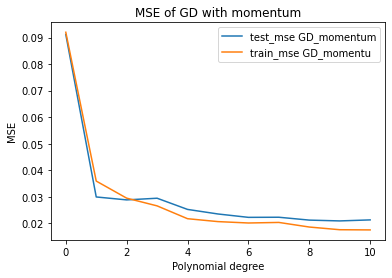

In [18]:
plt.plot(np.arange(0,max_degree + 1), mse_gd_poly_moment, label='test_mse GD_momentum')
plt.plot(np.arange(0,max_degree +1), mse_gd_poly_train_moment, label='train_mse GD_momentu')
plt.legend()
plt.xlabel("Polynomial degree")
plt.ylabel("MSE")
plt.title("MSE of GD with momentum")
plt.show()


# Tuning learning rate For gradiant descent OLS  

In [19]:
z = FrankeFunction(x_flat,y_flat)
z = noiseGeneration(z)

theta = []
theta_i = 0
z_mesh = FrankeFunction(x_mesh,y_mesh)
numberOfEtas = 10 #number number of learning rates to be cehcked
etas = np.logspace(-4,-1,numberOfEtas + 1)# checking 30 learning rates from e-3 to e-1
print(etas)
max_degree = 10
itter_j = 0
itteration_list = np.zeros((max_degree + 1,len(etas)))
poly = []
eta_list = []
mse_eta_test = np.zeros((max_degree + 1,len(etas)))
mse_eta_train = np.zeros((max_degree + 1,len(etas)))
for i in range(0, max_degree + 1):
    poly.append(i)
    X = X_generator(x_flat,y_flat,i)
    X_train,X_test,z_train,z_test = traningDataGenerator(X,z)
    for j in range(numberOfEtas + 1):
        eta = etas[j]
        theta_i,itter_j = momentum_GD_OLS(X_train,z_train,eta)
        z_pred_ols = X_test @ theta_i
        z_tilde_ols = X_train@ theta_i
        itteration_list[i,j] = itter_j
        mse_eta_test[i,j] = mean_squared_error(z_test,z_pred_ols)
        mse_eta_train[i,j] = mean_squared_error(z_train,z_tilde_ols)

for i in range(numberOfEtas + 1):
    eta_list.append("eta_{}".format(i))
df_mse_test_momentum_diffeta = pd.DataFrame(mse_eta_test, index = poly, columns = eta_list)


df_itteration_momentum_diffeta = pd.DataFrame(itteration_list, index = poly, columns = eta_list)


#df_Gd_hessian = pd.DataFrame({"Test_Mse_momentum":mse_gd_poly_moment,"test_MSE_batchGd":mse_gd_poly})

[0.0001     0.00019953 0.00039811 0.00079433 0.00158489 0.00316228
 0.00630957 0.01258925 0.02511886 0.05011872 0.1       ]


In [20]:
df_mse_test_momentum_diffeta

,eta_0,eta_1,eta_2,eta_3,eta_4,eta_5,eta_6,eta_7,eta_8,eta_9,eta_10
0,0.091050,0.091136,0.091158,0.091163,0.091164,0.091163,0.091165,0.091164,0.091164,0.091164,0.091164
1,0.063058,0.030593,0.029643,0.029860,0.029943,0.029966,0.029971,0.029973,0.029973,0.029973,0.029973
2,0.033475,0.028472,0.027596,0.027130,0.025093,0.028065,0.029863,0.030406,0.030549,0.030585,0.030593
3,0.081526,0.073948,0.047752,0.026140,0.028195,0.029368,0.029465,0.027774,0.025027,0.024386,0.024320
4,0.063271,0.042112,0.023510,0.025187,0.027278,0.027597,0.026121,0.024326,0.023881,0.023642,0.023454
5,0.070192,0.038590,0.031252,0.032878,0.032927,0.030381,0.024427,0.023334,0.022925,0.022574,0.019157
6,0.078824,0.046750,0.037657,0.036877,0.033942,0.024872,0.022869,0.022270,0.021514,0.019390,0.018078
7,0.103672,0.058308,0.048886,0.044509,0.033785,0.024333,0.023062,0.022504,0.020946,0.019141,0.018445
8,0.168512,0.097669,0.075012,0.051918,0.030406,0.023976,0.023062,0.022234,0.020372,0.019556,0.018670
9,0.150520,0.086173,0.066775,0.042930,0.024509,0.022427,0.021948,0.021326,0.020830,0.020192,0.018762


<AxesSubplot:>

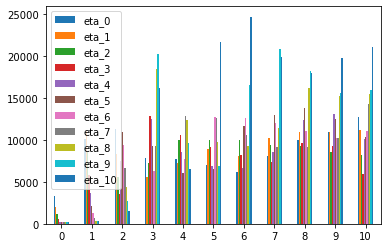

In [21]:
df_itteration_momentum_diffeta.plot.bar(rot=0)

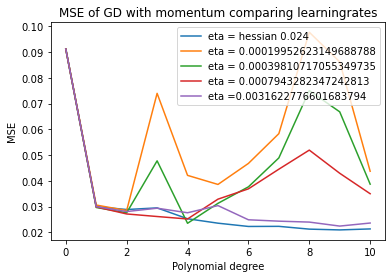

In [22]:
plt.plot(np.arange(0,max_degree + 1), mse_gd_poly_moment, label='eta = hessian 0.024')
#plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_0"], label='eta = 0.01')
plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_1"], label='eta = {}'.format(etas[1]))
plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_2"], label='eta = {}'.format(etas[2]))
plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_3"], label='eta = {}'.format(etas[3]))
#plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_4"], label='eta = 0.082')
plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_5"], label='eta ={}'.format(etas[5]))
plt.legend()
plt.xlabel("Polynomial degree")
plt.ylabel("MSE")
plt.title("MSE of GD with momentum comparing learningrates")
plt.show()

<AxesSubplot:>

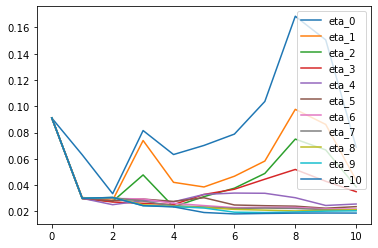

In [23]:
df_mse_test_momentum_diffeta.plot()

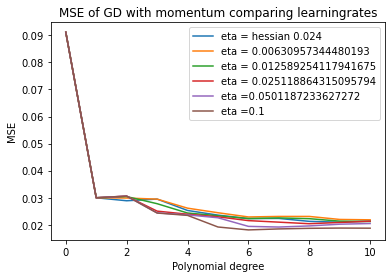

In [24]:
plt.plot(np.arange(0,max_degree + 1), mse_gd_poly_moment, label='eta = hessian 0.024')
#plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_0"], label='eta = 0.01')
plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_6"], label='eta = {}'.format(etas[6]))
plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_7"], label='eta = {}'.format(etas[7]))
plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_8"], label='eta = {}'.format(etas[8]))
#plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_4"], label='eta = 0.082')
plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_9"], label='eta ={}'.format(etas[9]))
plt.plot(np.arange(0,max_degree +1), df_mse_test_momentum_diffeta["eta_10"], label='eta ={}'.format(etas[10]))
plt.legend()
plt.xlabel("Polynomial degree")
plt.ylabel("MSE")
plt.title("MSE of GD with momentum comparing learningrates")
plt.show()

# Making Heat Map for momentum based GD based on gamma and eta. OLS

 Taking into consdieration of previous the polynomial degree of 6 seems to be an overall best fit. across learning rates including hte heassian

In [25]:
theta = []
theta_i = 0
z_mesh = FrankeFunction(x_mesh,y_mesh)
numberOfEtas = 10 #number number of learning rates to be cehcked
etas = np.logspace(-4,-1,numberOfEtas + 1)# checking 30 learning rates from e-3 to e-1


X = X_generator(x_flat,y_flat,6)
z = FrankeFunction(x_flat,y_flat)
z = noiseGeneration(z)
X_train,X_test,z_train,z_test = traningDataGenerator(X,z)


gammas = np.arange(0.1,0.95,0.05)
print(len(gammas))
itter_j = 0
itteration_list = np.zeros((len(gammas),len(etas)))
poly = []
eta_list = []
mse_eta_test = np.zeros((len(gammas),len(etas)))
mse_eta_train = np.zeros((len(gammas),len(etas)))
for i in range(len(gammas)):
    gamma = gammas[i]
    for j in range(numberOfEtas + 1):
        eta = etas[j]
        theta_i,itter_j = momentum_GD_OLS(X_train,z_train,eta,gamma)
        z_pred_ols = X_test @ theta_i
        z_tilde_ols = X_train@ theta_i
        itteration_list[i,j] = itter_j
        mse_eta_test[i,j] = mean_squared_error(z_test,z_pred_ols)
        mse_eta_train[i,j] = mean_squared_error(z_train,z_tilde_ols)

for i in range(numberOfEtas + 1):
    eta_list.append("eta_{}".format(i))
df_mse_heatmap_gd = pd.DataFrame(mse_eta_test, index = gammas, columns = eta_list)


df_itteration_heatmap_gd = pd.DataFrame(itteration_list, index = gammas, columns = eta_list)


17


In [26]:
df_mse_heatmap_gd

,eta_0,eta_1,eta_2,eta_3,eta_4,eta_5,eta_6,eta_7,eta_8,eta_9,eta_10
0.10,0.450129,0.126735,0.094177,0.081062,0.053658,0.037821,0.037102,0.034885,0.025821,0.023033,0.022365
0.15,0.383061,0.121264,0.092922,0.079999,0.050161,0.037725,0.036997,0.034508,0.025349,0.022953,0.022321
0.20,0.325743,0.116444,0.091657,0.078829,0.047108,0.037656,0.036873,0.033993,0.024922,0.022877,0.022274
0.25,0.277498,0.112191,0.090369,0.077524,0.044519,0.037606,0.036728,0.033231,0.024537,0.022804,0.022224
0.30,0.237411,0.108425,0.089043,0.076013,0.042403,0.037563,0.036556,0.032107,0.024196,0.022734,0.022169
0.35,0.204502,0.105068,0.087660,0.074181,0.040749,0.037519,0.036352,0.030747,0.023895,0.022664,0.022108
0.40,0.177835,0.102036,0.086203,0.071751,0.039523,0.037461,0.036106,0.029368,0.023631,0.022593,0.022039
0.45,0.156497,0.099258,0.084642,0.067984,0.038672,0.037380,0.035805,0.028058,0.023402,0.022521,0.021957
0.50,0.139635,0.096647,0.082941,0.061381,0.038129,0.037264,0.035416,0.026857,0.023203,0.022445,0.021856
0.55,0.126473,0.094130,0.081034,0.053493,0.037817,0.037100,0.034874,0.025799,0.023029,0.022363,0.021720


In [27]:
df_mse_test_momentum_diffeta # Comparing that gamma = 0.9 is equal in both cases 

,eta_0,eta_1,eta_2,eta_3,eta_4,eta_5,eta_6,eta_7,eta_8,eta_9,eta_10
0,0.091050,0.091136,0.091158,0.091163,0.091164,0.091163,0.091165,0.091164,0.091164,0.091164,0.091164
1,0.063058,0.030593,0.029643,0.029860,0.029943,0.029966,0.029971,0.029973,0.029973,0.029973,0.029973
2,0.033475,0.028472,0.027596,0.027130,0.025093,0.028065,0.029863,0.030406,0.030549,0.030585,0.030593
3,0.081526,0.073948,0.047752,0.026140,0.028195,0.029368,0.029465,0.027774,0.025027,0.024386,0.024320
4,0.063271,0.042112,0.023510,0.025187,0.027278,0.027597,0.026121,0.024326,0.023881,0.023642,0.023454
5,0.070192,0.038590,0.031252,0.032878,0.032927,0.030381,0.024427,0.023334,0.022925,0.022574,0.019157
6,0.078824,0.046750,0.037657,0.036877,0.033942,0.024872,0.022869,0.022270,0.021514,0.019390,0.018078
7,0.103672,0.058308,0.048886,0.044509,0.033785,0.024333,0.023062,0.022504,0.020946,0.019141,0.018445
8,0.168512,0.097669,0.075012,0.051918,0.030406,0.023976,0.023062,0.022234,0.020372,0.019556,0.018670
9,0.150520,0.086173,0.066775,0.042930,0.024509,0.022427,0.021948,0.021326,0.020830,0.020192,0.018762


<AxesSubplot:>

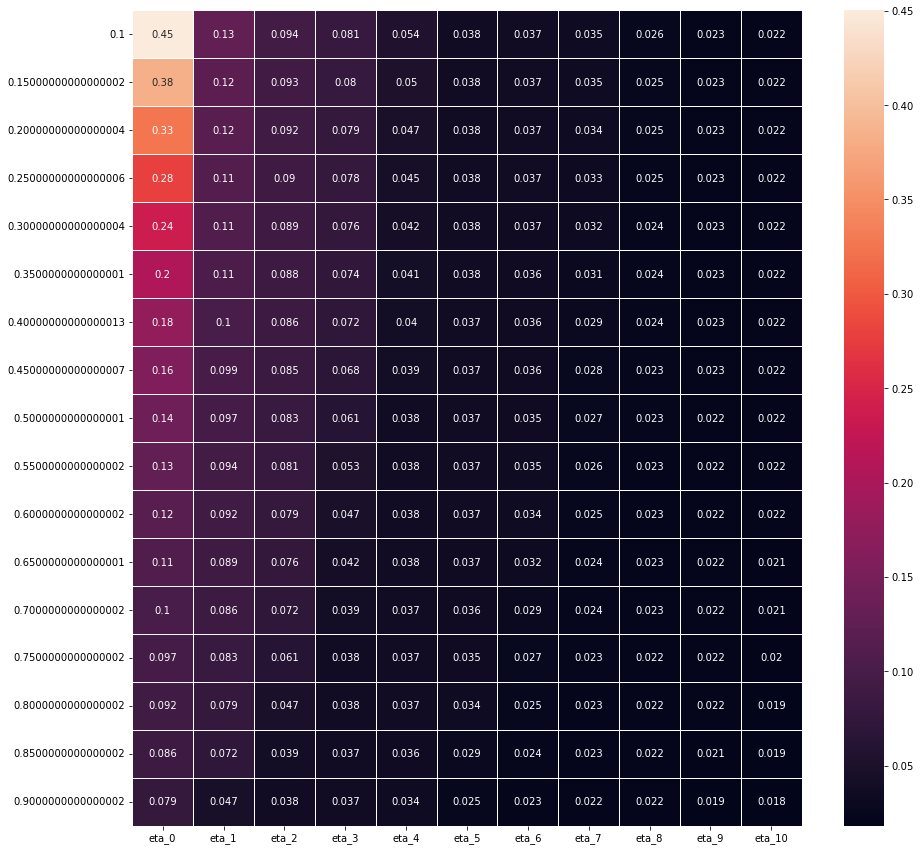

In [32]:
fig, ax = plt.subplots(figsize=(15,15))   
sns.heatmap(df_mse_heatmap_gd,annot =True, linewidths=.5, ax=ax)


<AxesSubplot:>

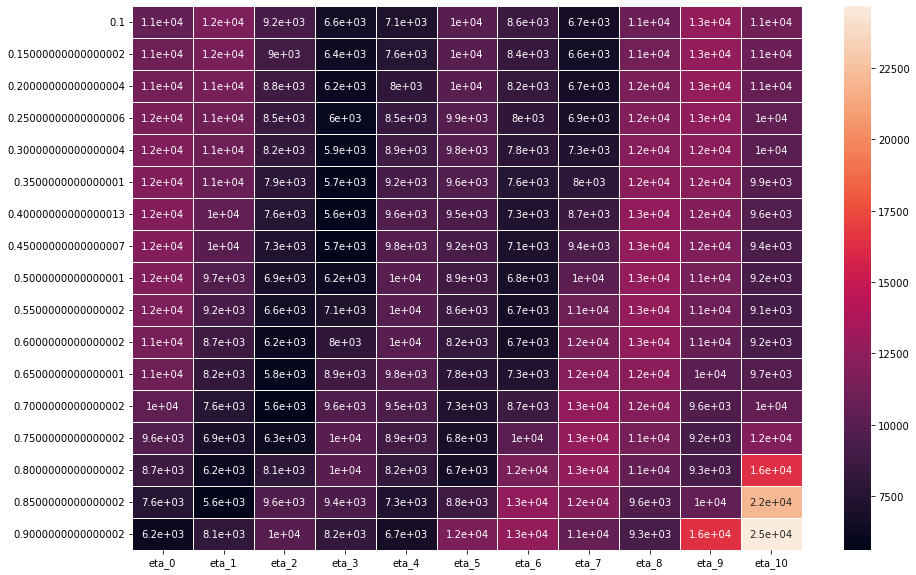

In [29]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_itteration_heatmap_gd,annot =True, linewidths=.8, ax=ax,fmt='.2g')

# creating a function fo the mini batches

In [33]:
def mini_batch_creator(X, y, batch_size):
        mini_batches = [] # empty list for the mini batchess
        data_matrix = np.hstack((X, y.reshape(-1, 1)))  # Column 0 to n-1 is data, column n is the target data
        
        np.random.shuffle(data_matrix) # would not be stochastic if it didnt include random. 
        
        m = data_matrix.shape[0] // batch_size # number of minibatches number of rows/datapoints divided by selected batchsize
        i=0
        for i in range(m):
            mini_batch = data_matrix[i * batch_size:(i + 1)*batch_size, :]#creating a mini batch
            X_mini = mini_batch[:, :-1] #evry thing except the last column
            Y_mini = mini_batch[:, -1] #exclusively the last column
            mini_batches.append((X_mini, Y_mini)) # has 2 arrays, first array contains the minibatches for x and the second for y
        if data_matrix.shape[0] % batch_size != 0:
            mini_batch = data_matrix[i * batch_size:data_matrix.shape[0]]
            X_mini = mini_batch[:, :-1]
            Y_mini = mini_batch[:, -1]
            mini_batches.append((X_mini, Y_mini))
        return mini_batches

# Cost functions


In [35]:
def Cost_func_ols(y,X,theta):
    return np.sum((y-X @ theta)**2)


In [36]:
gradient_ols = grad(Cost_func_ols,2) # this is the gradient calculation with respect to theta.
print(grad_descent_ols)

<function grad_descent_ols at 0x0000023496DB9160>


# Scehdulers

In [37]:
def learning_schedule(eta,decay,epoch):
    return (eta/(1+decay*epoch))
    

# Stochastic gradient descent OLS 

In [38]:
def SGD_OLS(X_train,y_train,n_epochs,batch_size,eta = 0.1,gamma = 0.9,delta=1e-8,rho = 0.99, algo = "MOM",decay = 1e-5):
    np.random.seed(644)
    
    gradient_ols = grad(Cost_func_ols,2)
    gradient_n = 0 #some inital value
    learnin_rate = []
    if algo == "MOM":
        beta = np.random.randn(X_train.shape[1]) # Picking elements in beta, number of columns in design matrix
        beta = beta.reshape(-1,1) #Column vector
        v_previous = 0
        for epoch in range(n_epochs):
            mini_batches = mini_batch_creator(X_train,y_train,batch_size)
            for batch in mini_batches:
                X_mini_i,Y_mini_i = batch
                Y_mini_i = Y_mini_i.reshape(-1,1) # need a column vector
                Y_mini_i = Y_mini_i.reshape(-1,1) # Column vector
                dc_db = (1/batch_size)*gradient_ols(Y_mini_i,X_mini_i,beta)
                eta = learning_schedule(eta,decay,epoch)
                v_vector = gamma*v_previous + eta*dc_db
                beta = beta - v_vector
                v_previous = v_vector
            learnin_rate.append(eta)
        theta_moment = beta
        lr = eta
        return theta_moment,lr
    
    
    
    elif algo == "RMS":
        beta = np.random.randn(X_train.shape[1]) # Picking elements in beta, number of columns in design matrix
        beta = beta.reshape(-1,1)
        for epoch in range(n_epochs):
            # The outer product is calculated from scratch for each epoch
            mini_batches = mini_batch_creator(X_train,y_train,batch_size)
            Giter = np.zeros(shape=(len(beta),len(beta)))
            for batch in mini_batches:
                X_mini_i,Y_mini_i = batch
                Y_mini_i = Y_mini_i.reshape(-1,1) # Column vector
                dc_db = (1/batch_size)*gradient_ols(Y_mini_i,X_mini_i,beta) #g_t in lecture notes
                # Previous value for the outer product of gradients
                Previous = Giter
                # Accumulated gradient
                Giter +=dc_db @ dc_db.T
                # Scaling with rho the new and the previous results
                Gnew = (rho*Previous+(1-rho)*Giter) #s_t in lecture notes
                # Taking the diagonal only and inverting
                Ginverse = np.c_[eta/(delta+np.sqrt(np.diagonal(Gnew)))]
                # Hadamard product
                update = np.multiply(Ginverse,dc_db)
                beta -= update
        theta = beta
        return theta
    
    
        
        
        
        
        
    elif algo == "ADG":
        beta = np.random.randn(X_train.shape[1]) # Picking elements in beta, number of columns in design matrix
        beta = beta.reshape(-1,1)
        i = 0
        for epoch in range(n_epochs):
            # The outer product is calculated from scratch for each epoch
            mini_batches = mini_batch_creator(X_train,y_train,batch_size)
            Giter = np.zeros(shape=(len(beta),len(beta)))
            I = np.eye(len(beta))
            for batch in mini_batches:
                X_mini_i,Y_mini_i = batch
                Y_mini_i = Y_mini_i.reshape(-1,1) # Column vector
                dc_db = (1/batch_size)*gradient_ols(Y_mini_i,X_mini_i,beta)
                # Calculate the outer product of the gradients
                Giter += dc_db @ dc_db.T
                # Simpler algorithm with only diagonal elements
                Ginverse = np.c_[eta/(delta+np.sqrt(np.diagonal(Giter)))]
                # compute update
                update = np.multiply(Ginverse,dc_db)
                beta = beta - update
                i += 1
        theta = beta
        return theta
        
        
    
    
    elif algo == "ADM":
        rho_2 = rho
        rho_1 = 0.9
        f_m = 0 #First moment
        s_m = 0 # second moment
        beta = np.random.randn(X_train.shape[1]) # Picking elements in beta, number of columns in design matrix
        beta = beta.reshape(-1,1)
        for epoch in range(1,n_epochs + 1):
            # The outer product is calculated from scratch for each epoch
            mini_batches = mini_batch_creator(X_train,y_train,batch_size)
            for batch in mini_batches:
                X_mini_i,Y_mini_i = batch
                Y_mini_i = Y_mini_i.reshape(-1,1) # Column vector
                dc_db = (1/batch_size)*gradient_ols(Y_mini_i,X_mini_i,beta) #g_t in lecture notes
                # Previous value for the outer product of gradients
                f_m = rho_1 * f_m + (1-rho_1) *dc_db
                s_m = rho_2 *s_m + (1-rho_2) * dc_db * dc_db
                #Unbias term
                f_b = (f_m/(1-rho_1**epoch)) # First unbias
                s_b = (s_m/(1-rho_2**epoch)) # second unbias
                
                #Uppdate
                update = eta * f_b/(np.sqrt(s_b)+ delta)
                beta -= update
        theta = beta
        return theta
    
    else:
        return "riase error, no valid function was found. Please select one of the following MOD,RMS,ADG,ADM"

# Initialize data 

In [39]:
#X = np.hstack((x_flat.reshape(-1,1),y_flat.reshape(-1,1)))
#print(X)

X = X_generator(x_flat,y_flat,6)
z = FrankeFunction(x_flat,y_flat)
z = noiseGeneration(z)
X_train,X_test,z_train,z_test = traningDataGenerator(X,z)
z_mesh = FrankeFunction(x_mesh,y_mesh)
z_mesh = noiseGeneration(z_mesh)

# Initialize evrything else. 

In [43]:
batch_size = 20
n_epochs = 100
gammas = np.arange(0.2,0.95,0.05)
decays = np.logspace(-6,-1,6)
deltas = np.logspace(-10,-5,6)
n_epochs_list = np.arange(10,110,10)
print(deltas)
print(decays)
print(gammas)

[1.e-10 1.e-09 1.e-08 1.e-07 1.e-06 1.e-05]
[1.e-06 1.e-05 1.e-04 1.e-03 1.e-02 1.e-01]
[0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85
 0.9 ]


# Analyzing parameters influence on momentum SGD decay on scheduler and gamma


C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


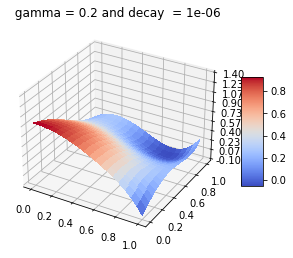

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


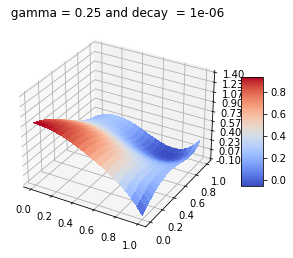

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


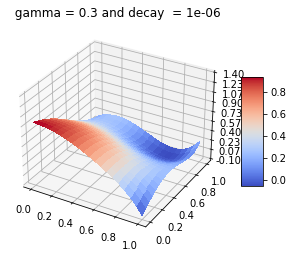

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


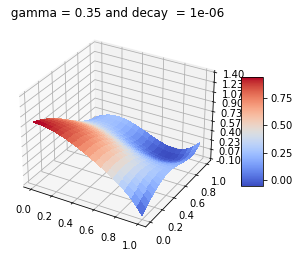

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


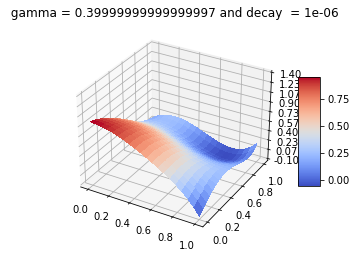

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


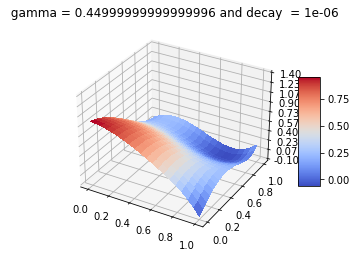

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


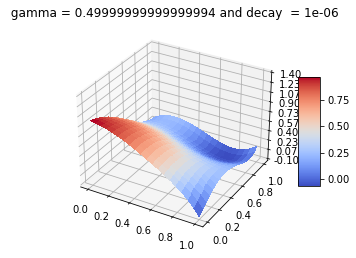

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


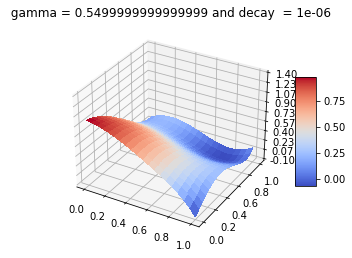

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


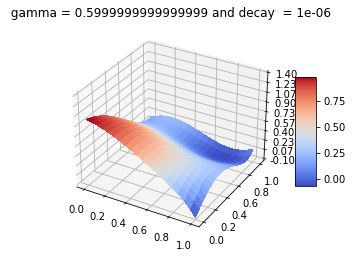

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


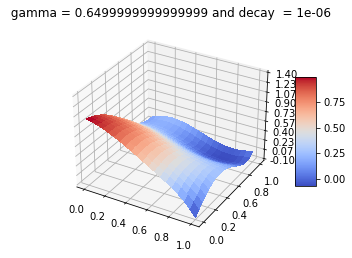

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


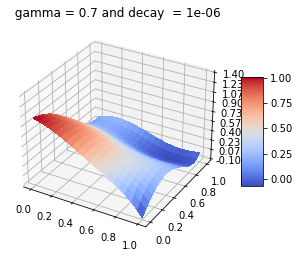

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


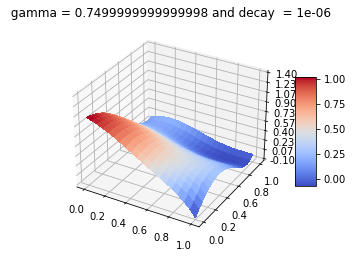

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


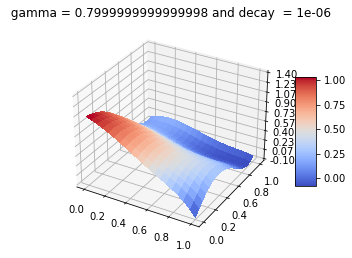

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


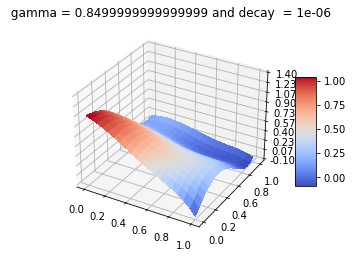

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


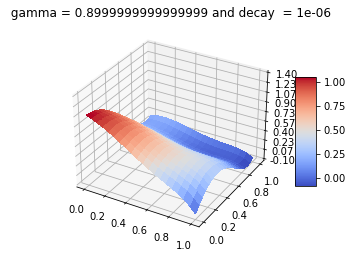

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


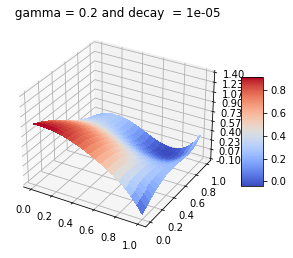

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


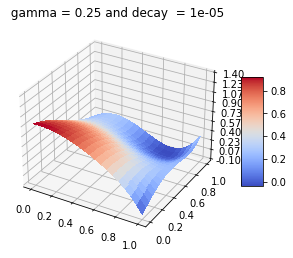

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


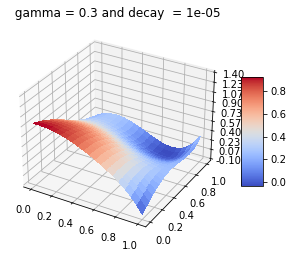

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


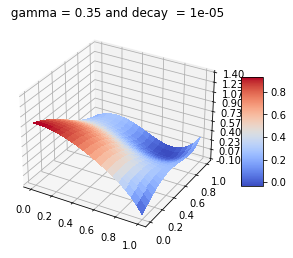

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


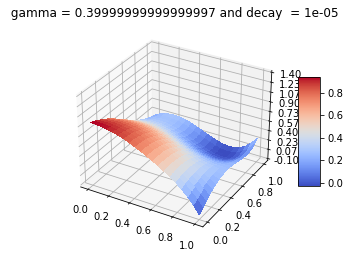

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


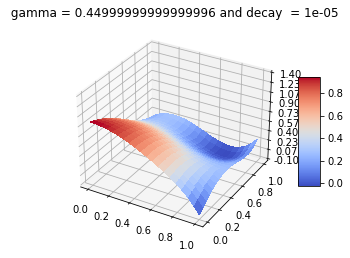

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


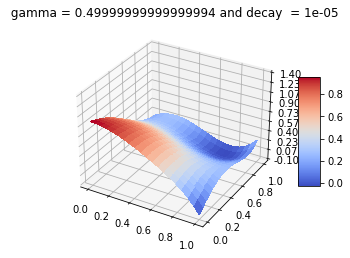

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


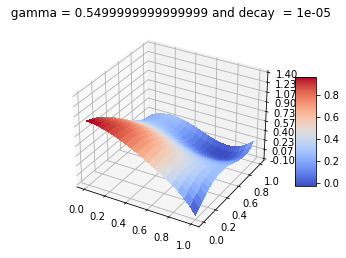

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


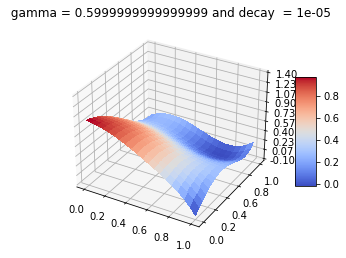

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


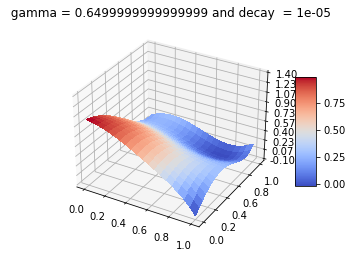

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


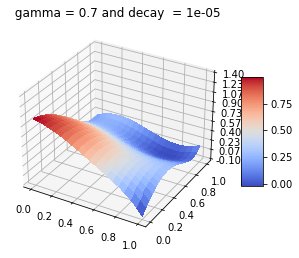

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


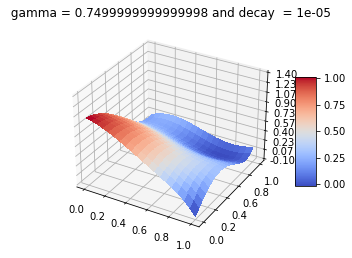

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


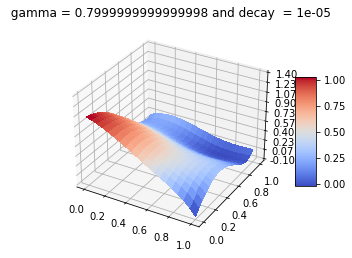

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


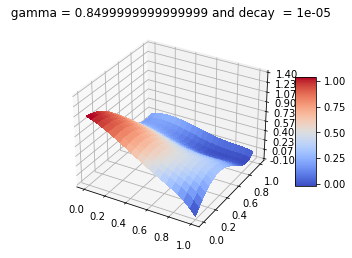

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


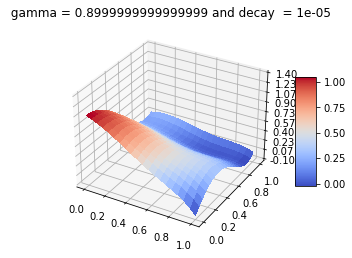

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


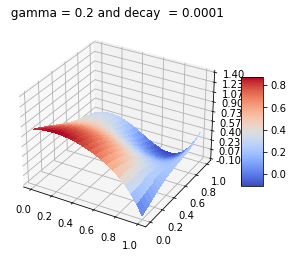

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


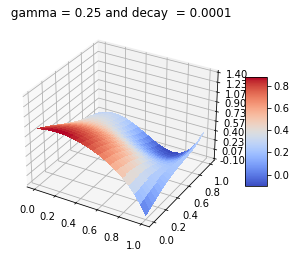

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


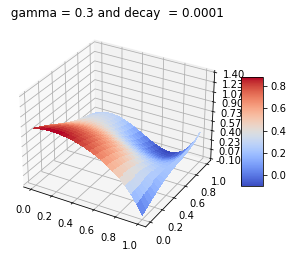

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


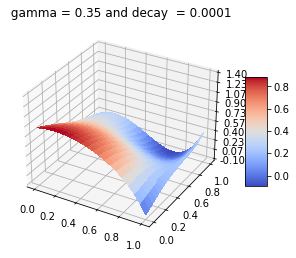

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


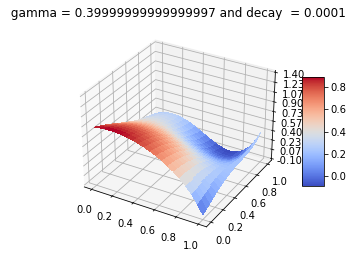

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


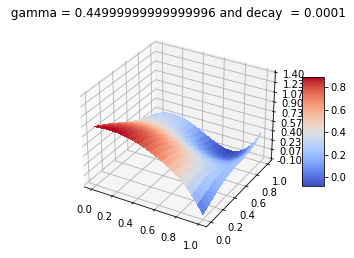

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


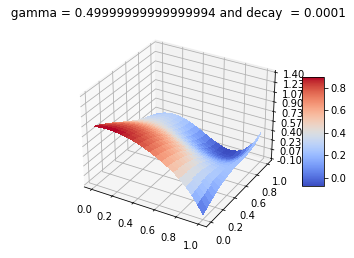

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


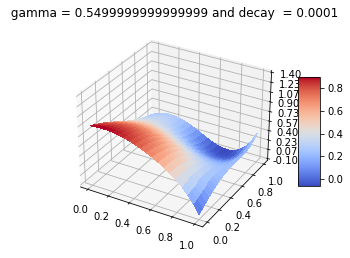

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


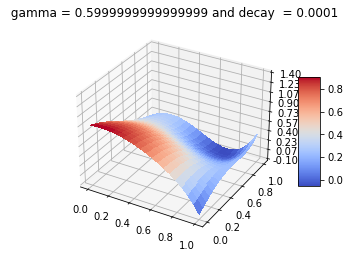

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


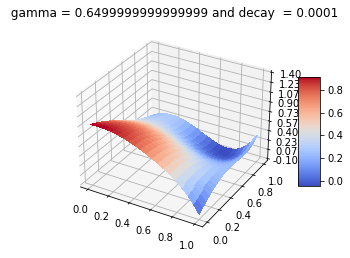

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


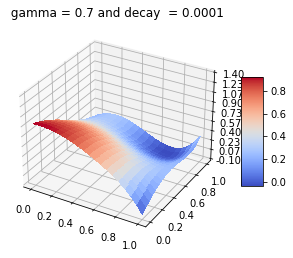

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


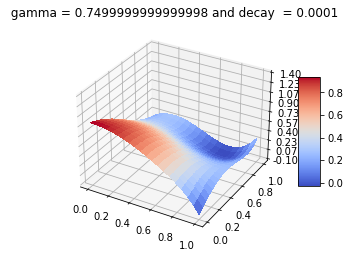

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


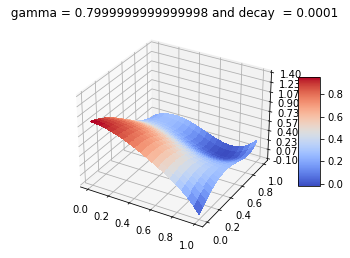

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


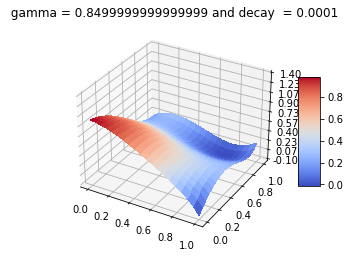

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


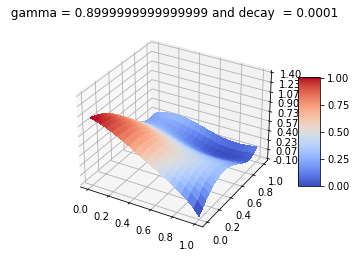

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


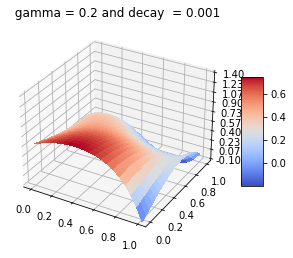

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


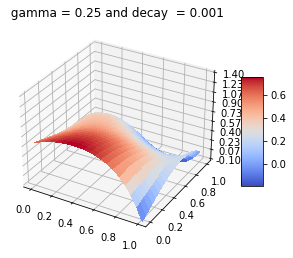

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


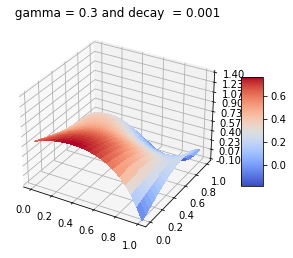

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


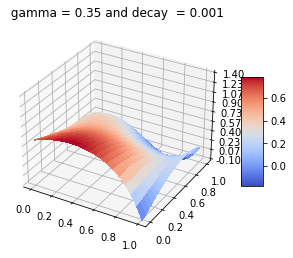

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


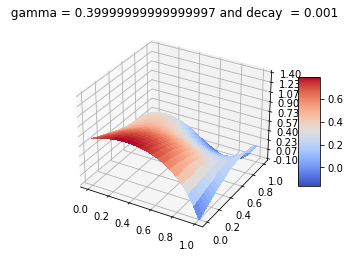

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


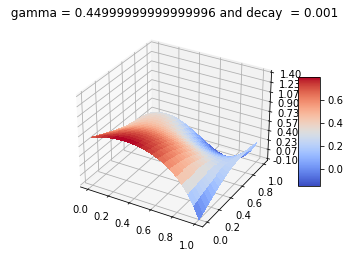

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


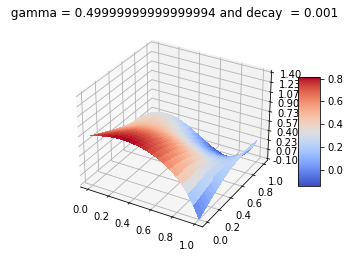

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


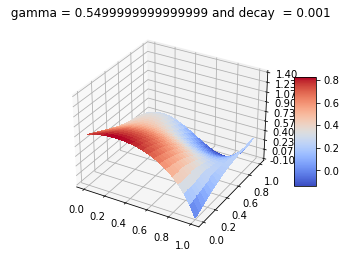

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


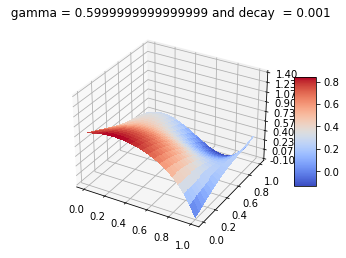

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


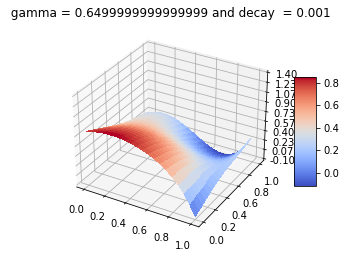

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


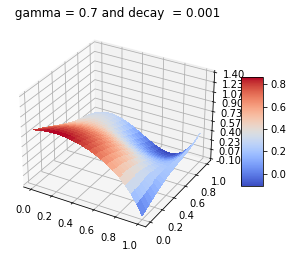

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


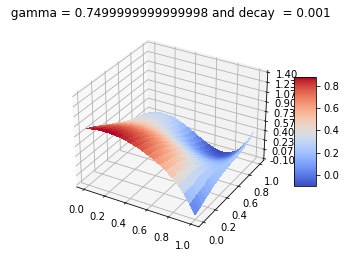

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


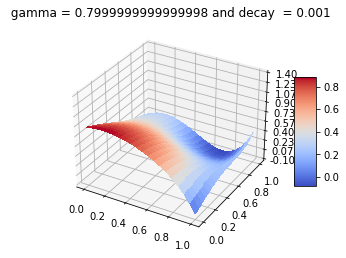

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


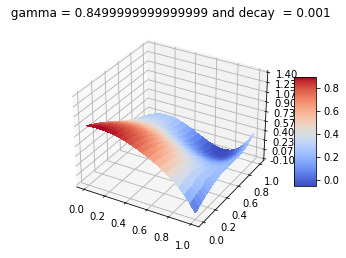

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


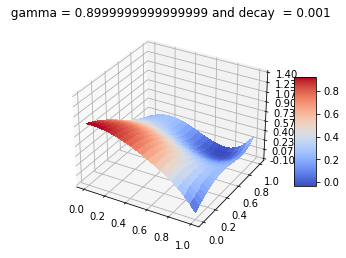

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


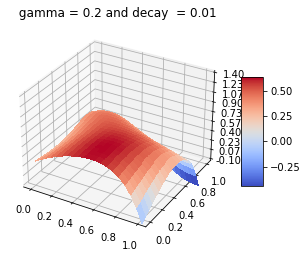

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


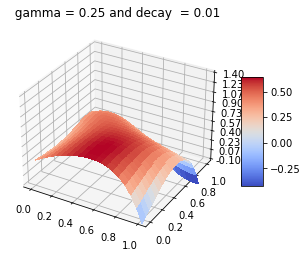

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


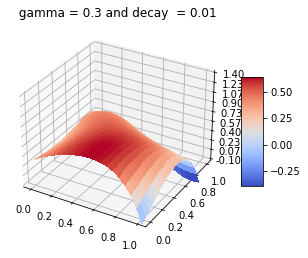

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


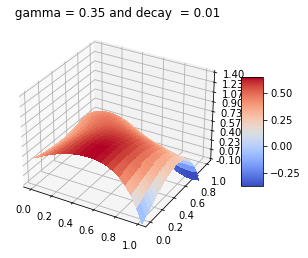

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


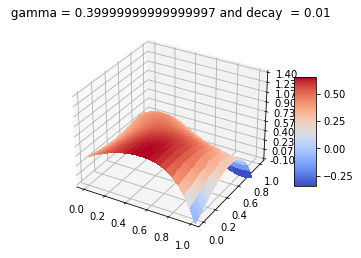

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


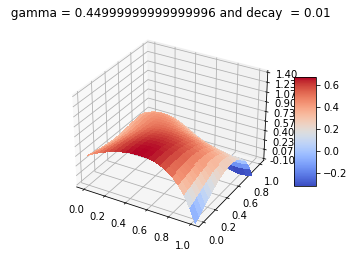

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


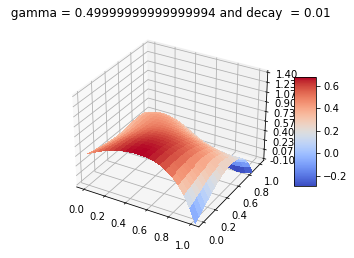

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


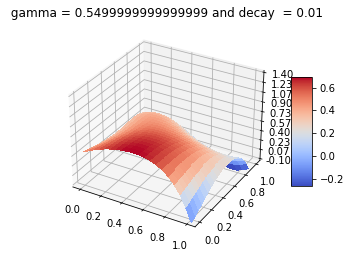

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


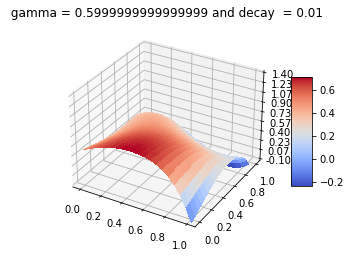

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


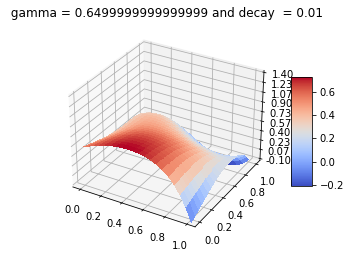

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


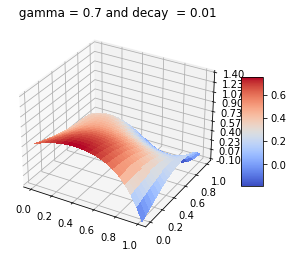

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


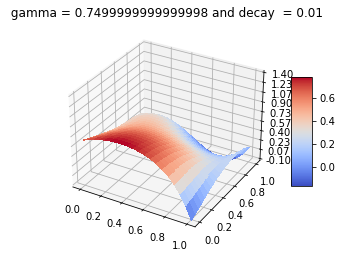

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


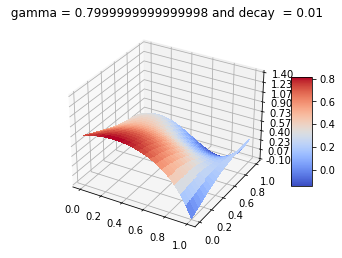

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


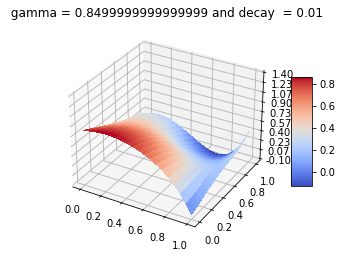

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


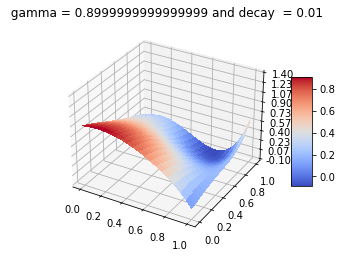

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


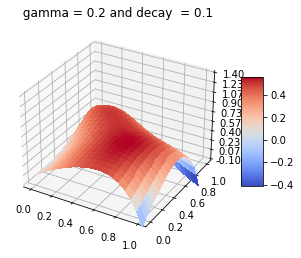

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


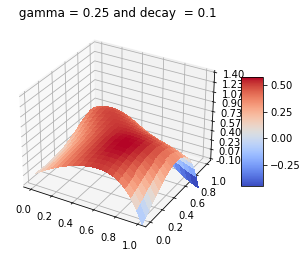

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


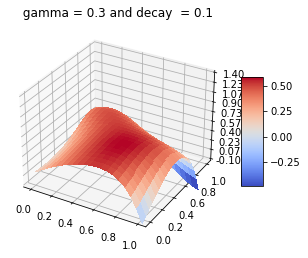

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


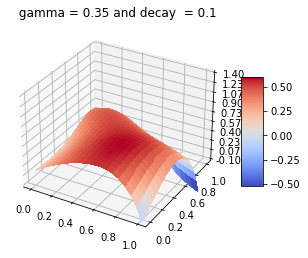

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


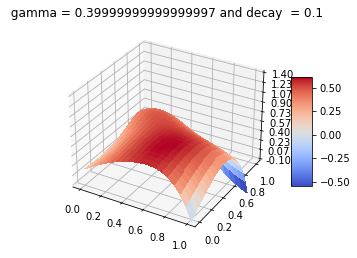

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


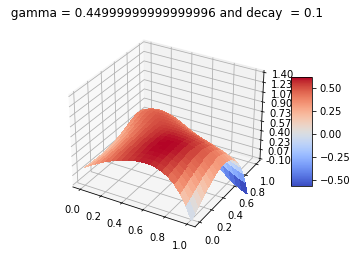

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


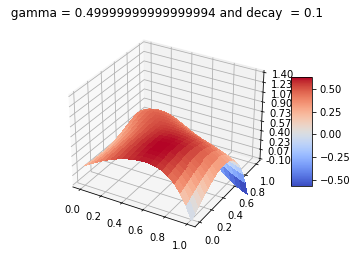

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


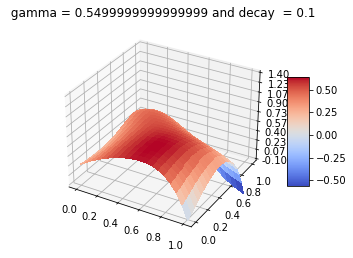

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


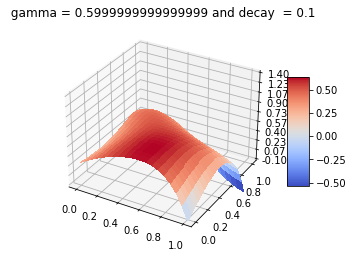

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


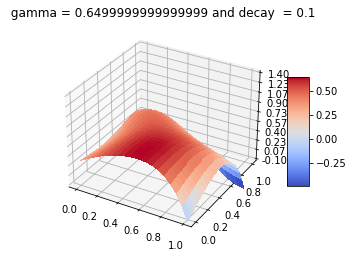

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


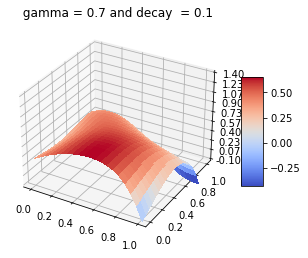

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


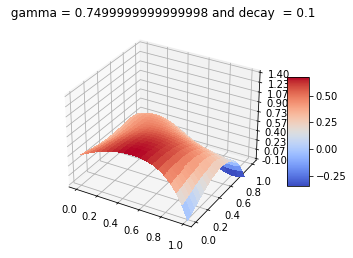

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


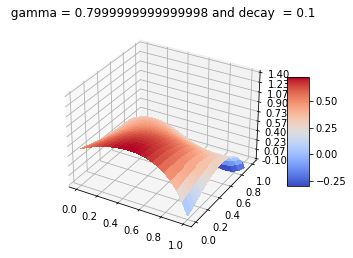

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


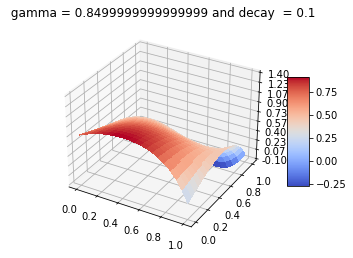

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


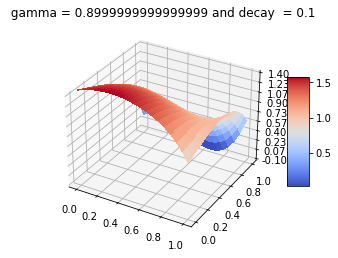

[[ 1.48242805]
 [ 0.66576329]
 [-0.57503317]
 [-1.0451317 ]
 [ 1.22917217]
 [ 0.053309  ]
 [-0.43428747]
 [-1.30910597]
 [-1.97158764]
 [-0.98636039]
 [ 0.48544365]
 [-0.79916936]
 [ 1.73404431]
 [-0.49544618]
 [ 1.44123644]
 [ 0.47085508]
 [ 0.1897138 ]
 [ 1.40646624]
 [-1.46585358]
 [-0.14694131]
 [-0.33426825]
 [-0.80547823]
 [ 1.7711196 ]
 [-0.54444267]
 [ 1.11073076]
 [-1.13288541]
 [ 1.48295154]
 [-0.87419544]]


In [44]:
cost_score_Mom = np.zeros((len(decays),len(gammas)))
learning_rates_Mom = np.zeros((len(decays),len(gammas)))
mse_test_Mom = np.zeros((len(decays),len(gammas)))
theta_j = 0
lr = 0

for i in range(len(decays)):
    decay = decays[i]
    for j in range(len(gammas)):
        gamma = gammas[j]
        theta_j,lr = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,gamma = gamma,decay=decay)
        z_pred = X_test @ theta_j
        z_plot = X @theta_j
        z_plot = z_plot.reshape(z_mesh.shape)
        plot_z(x_mesh,y_mesh,z_plot, title = " gamma = {} and decay  = {}".format(gammas[j],decays[i]))
        mse_test_Mom[i,j] = mean_squared_error(z_test,z_pred)
        cost_score_Mom[i,j] = Cost_func_ols(z_train,X_train,theta_j)
        learning_rates_Mom[i,j] = lr

print(theta_j)
        
    

In [45]:
gammas_list = []
for i in range(len(gammas)):
    gammas_list.append("gamma_{} = {}".format(i,gammas[i]))
df_mse_heatmap_mom = pd.DataFrame(mse_test_Mom, index = decays, columns = gammas_list)

df_mse_heatmap_mom

,gamma_0 = 0.2,gamma_1 = 0.25,gamma_2 = 0.3,gamma_3 = 0.35,gamma_4 = 0.39999999999999997,gamma_5 = 0.44999999999999996,gamma_6 = 0.49999999999999994,gamma_7 = 0.5499999999999999,gamma_8 = 0.5999999999999999,gamma_9 = 0.6499999999999999,gamma_10 = 0.7,gamma_11 = 0.7499999999999998,gamma_12 = 0.7999999999999998,gamma_13 = 0.8499999999999999,gamma_14 = 0.8999999999999999
0.000001,0.028727,0.028312,0.027908,0.027518,0.027148,0.026803,0.026488,0.026207,0.025965,0.025758,0.025573,0.025370,0.025065,0.024510,0.023572
0.000010,0.030308,0.029764,0.029197,0.028609,0.028001,0.027377,0.026743,0.026106,0.025479,0.024881,0.024341,0.023896,0.023578,0.023358,0.022952
0.000100,0.036706,0.036444,0.036112,0.035698,0.035188,0.034571,0.033834,0.032966,0.031959,0.030808,0.029509,0.028072,0.026524,0.024942,0.023506
0.001000,0.041445,0.040499,0.039639,0.038881,0.038242,0.037735,0.037367,0.037130,0.036994,0.036882,0.036654,0.036073,0.034809,0.032521,0.029076
0.010000,0.071677,0.069148,0.066461,0.063606,0.060580,0.057385,0.054033,0.050557,0.047030,0.043596,0.040522,0.038277,0.037616,0.039606,0.044052
0.100000,0.106883,0.102811,0.099113,0.095627,0.092169,0.088544,0.084564,0.080071,0.074965,0.069225,0.062913,0.056185,0.049743,0.056710,0.427254


<AxesSubplot:>

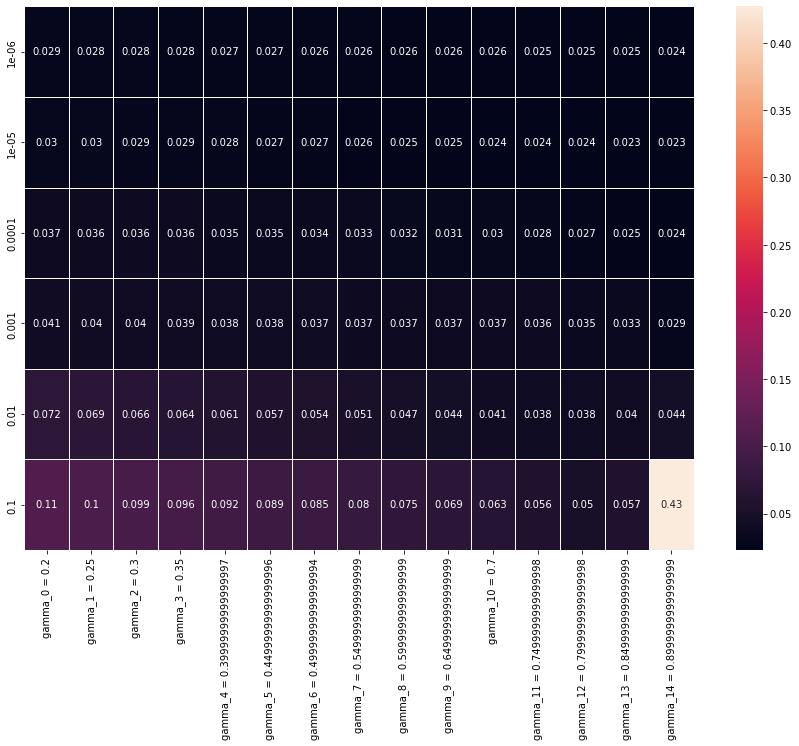

In [46]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_mom,annot =True, linewidths=.8, ax=ax,fmt='.2g')

Observed Litle to No change in the lower MSE region based on gamma and decay rate Setting the decay rate to 1e-6 seems to yield best results for high gammas or slightly betther than 1e-5, while 1e-5 seems to be the most stable.

# Running the same code above with decay = 1e-5 and different number of epochs

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


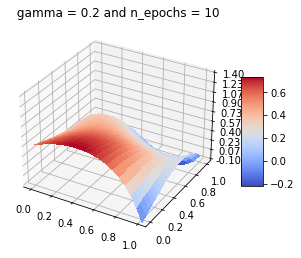

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


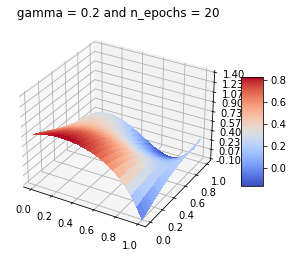

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


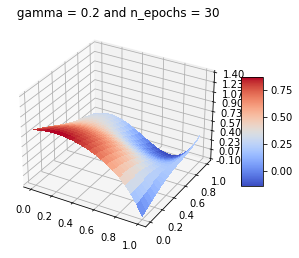

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


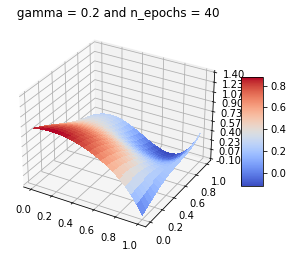

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


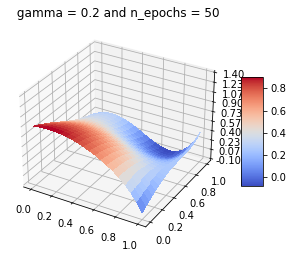

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


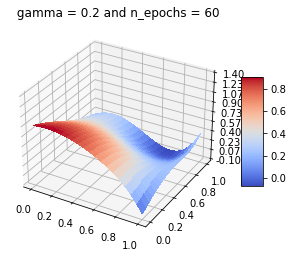

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


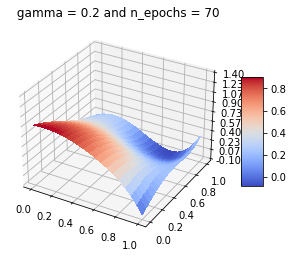

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


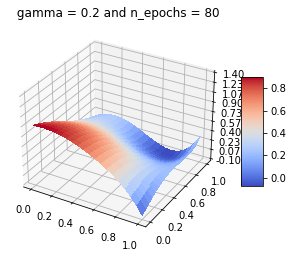

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


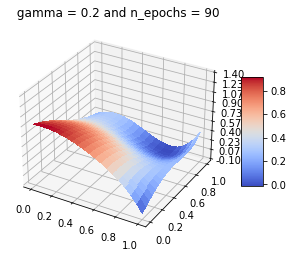

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


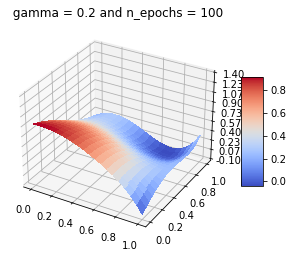

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


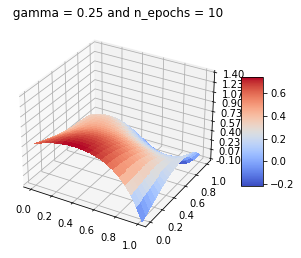

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


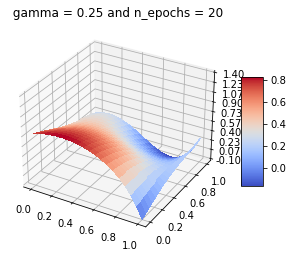

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


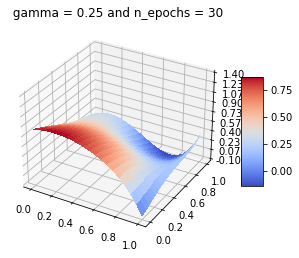

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


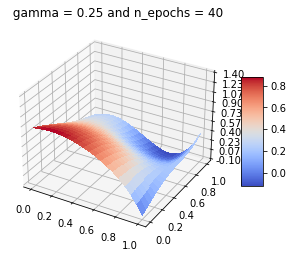

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


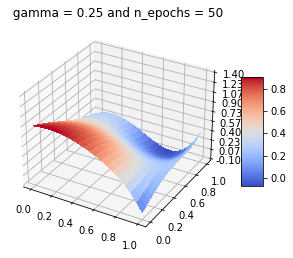

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


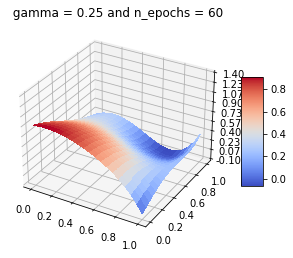

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


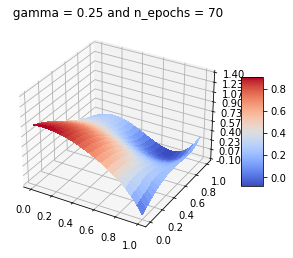

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


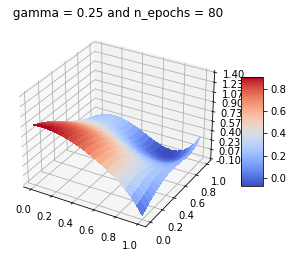

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


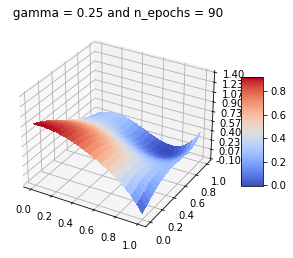

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


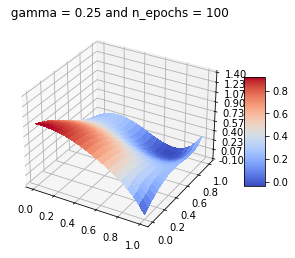

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


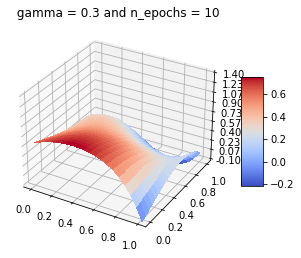

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


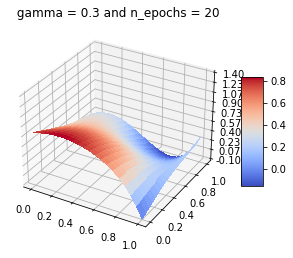

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


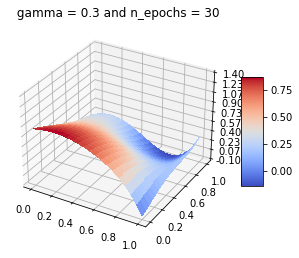

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


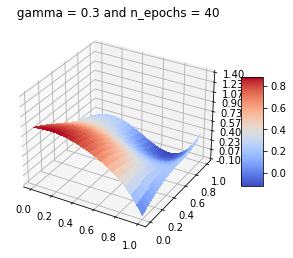

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


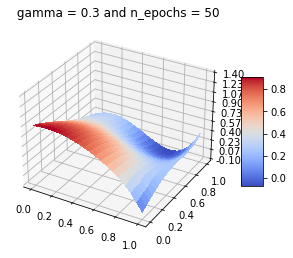

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


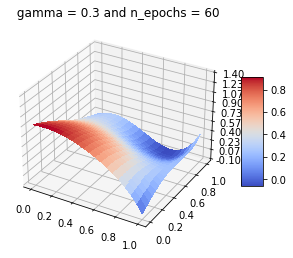

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


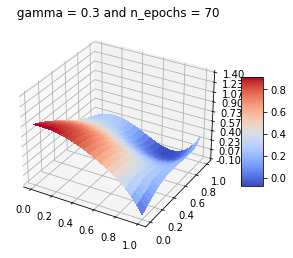

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


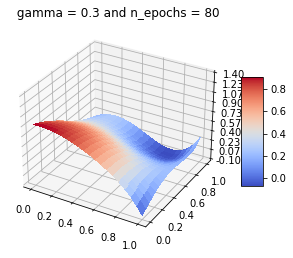

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


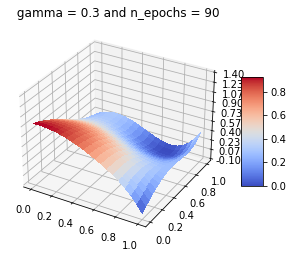

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


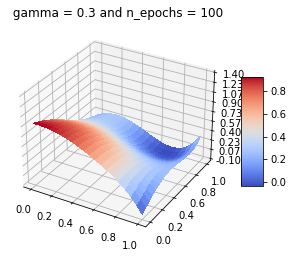

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


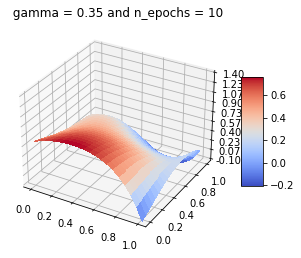

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


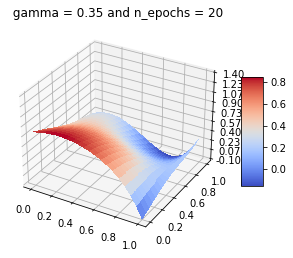

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


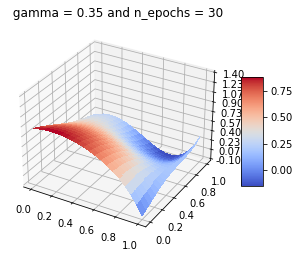

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


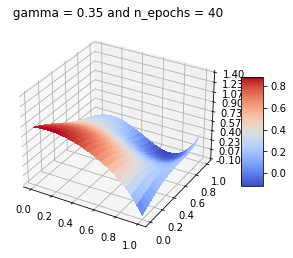

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


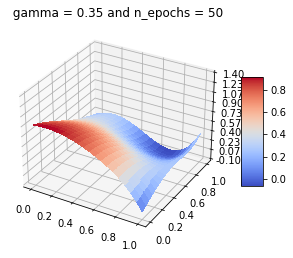

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


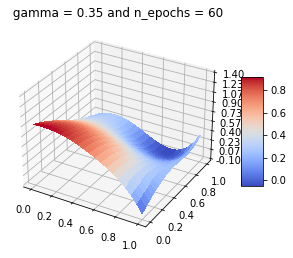

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


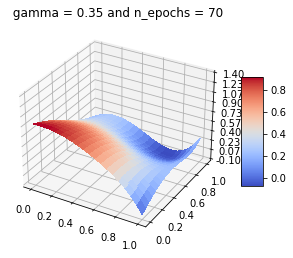

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


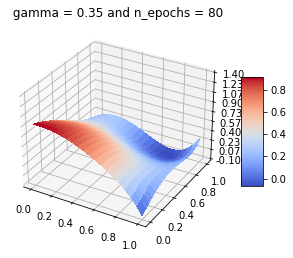

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


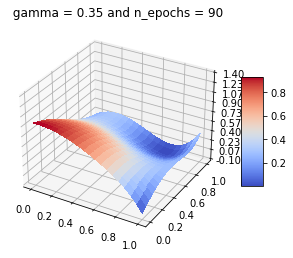

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


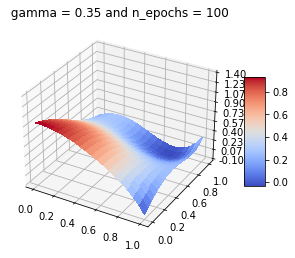

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


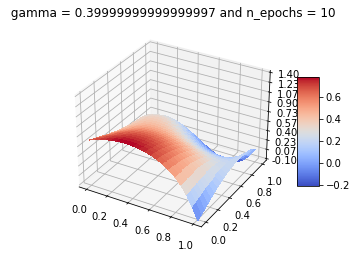

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


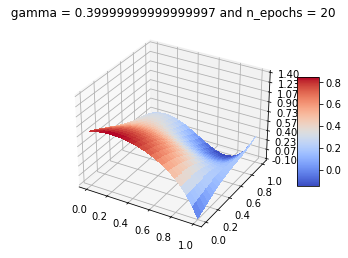

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


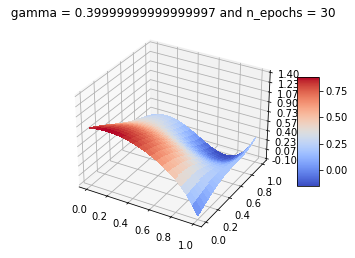

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


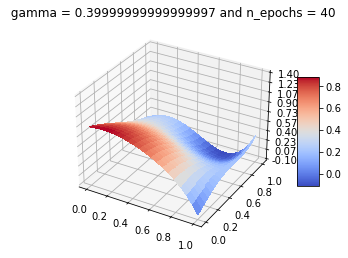

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


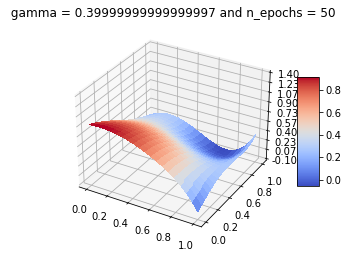

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


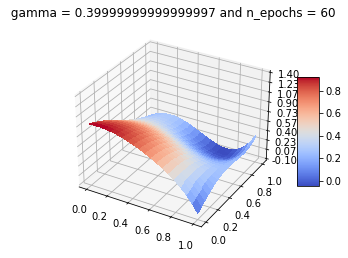

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


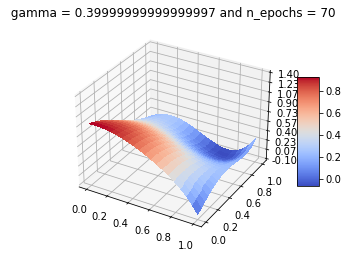

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


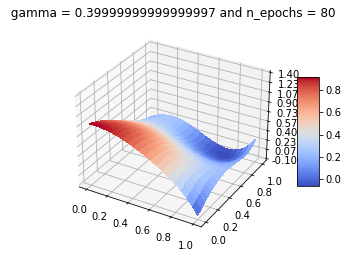

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


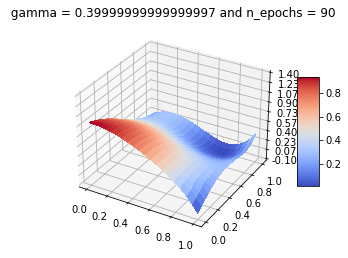

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


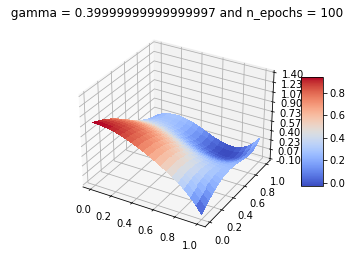

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


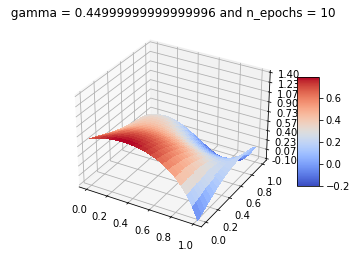

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


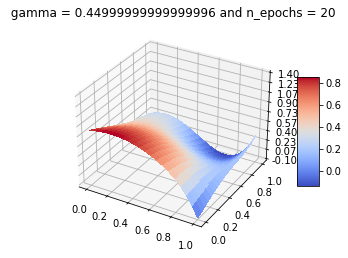

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


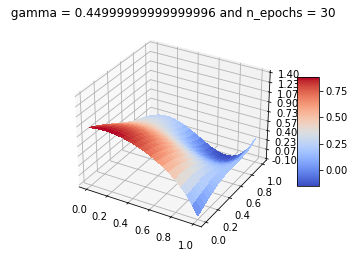

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


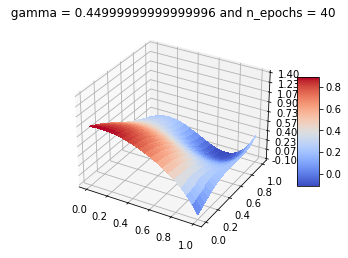

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


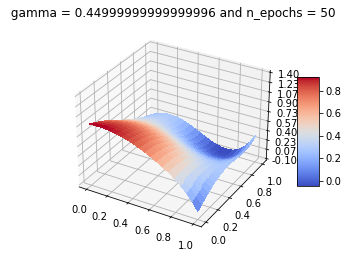

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


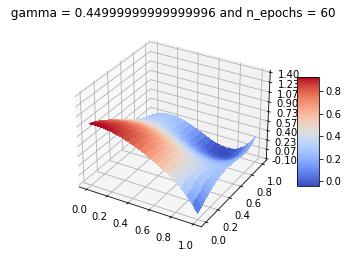

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


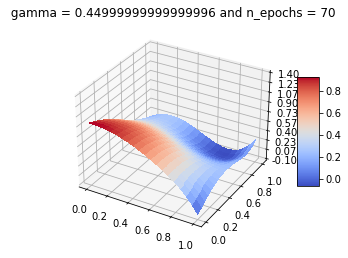

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


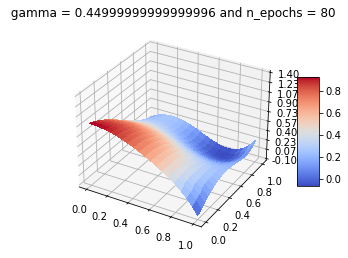

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


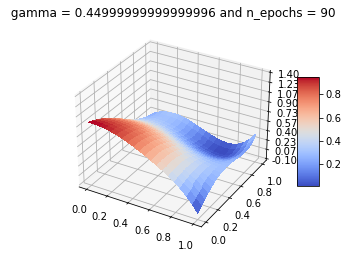

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


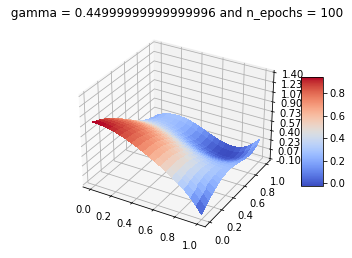

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


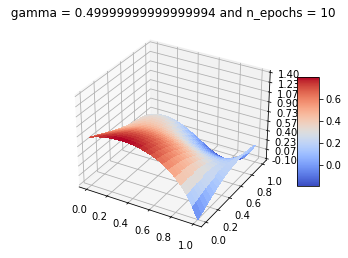

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


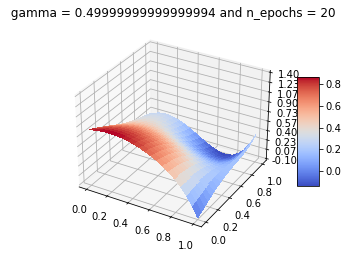

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


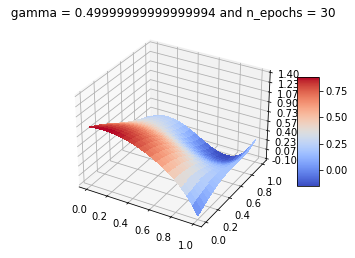

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


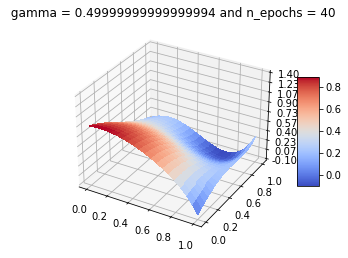

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


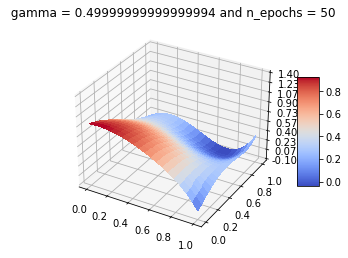

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


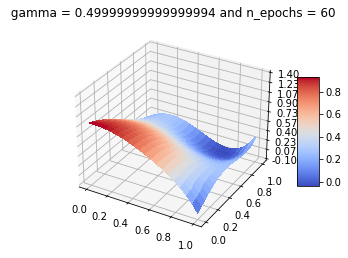

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


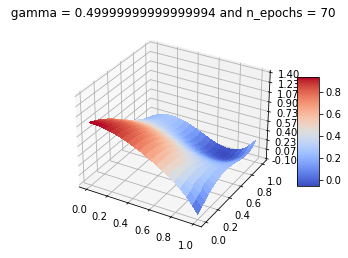

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


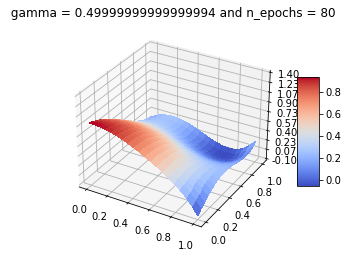

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


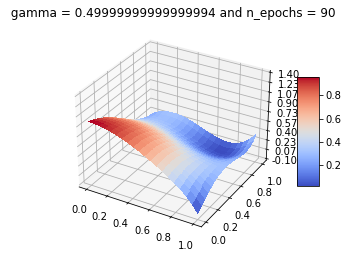

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


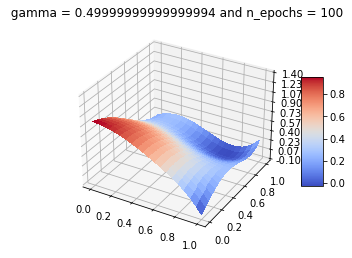

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


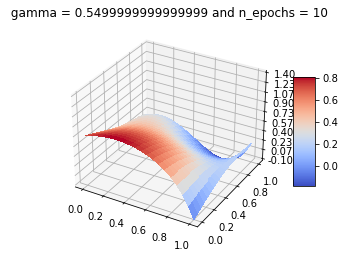

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


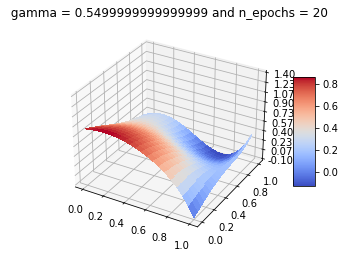

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


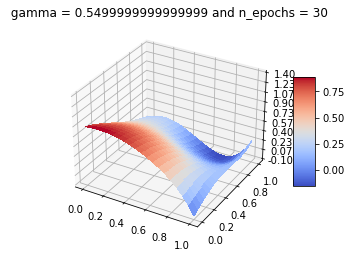

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


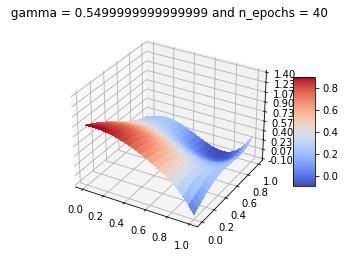

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


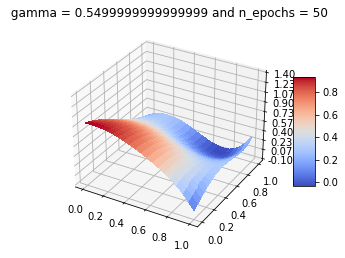

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


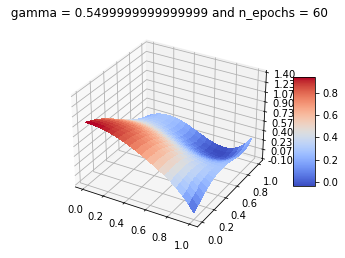

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


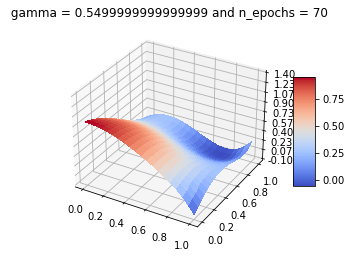

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


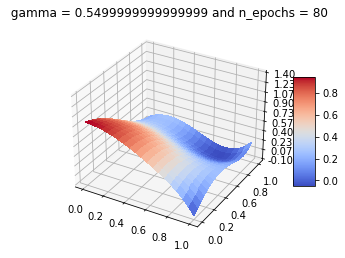

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


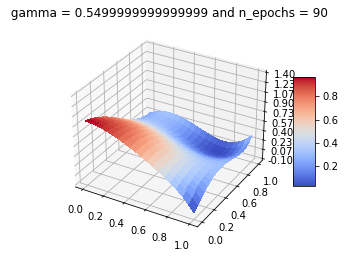

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


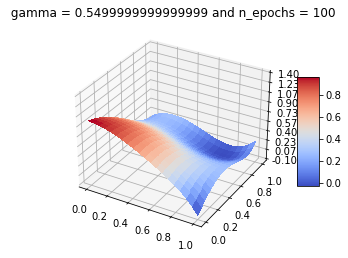

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


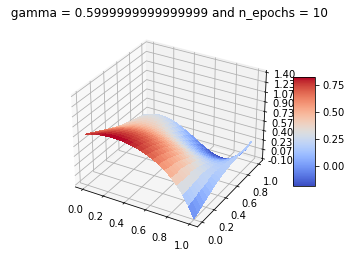

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


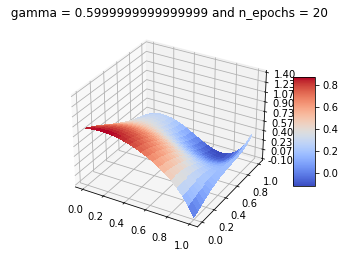

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


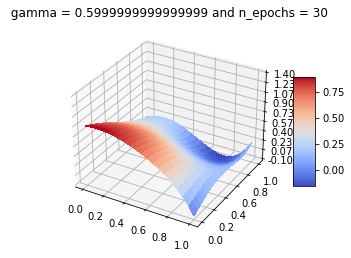

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


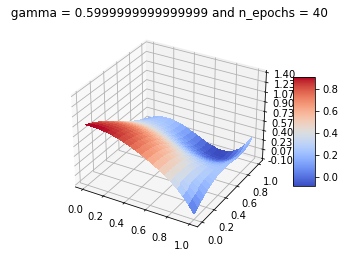

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


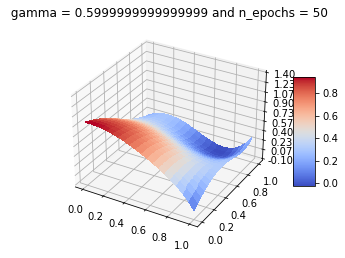

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


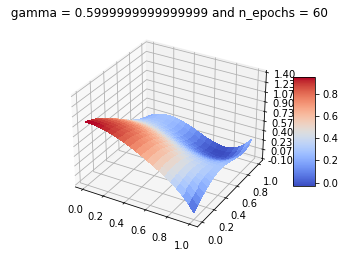

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


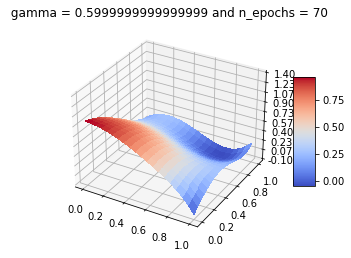

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


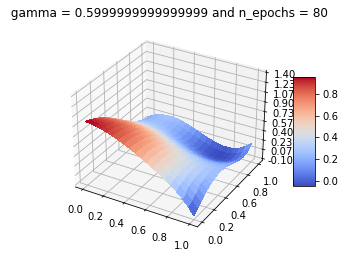

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


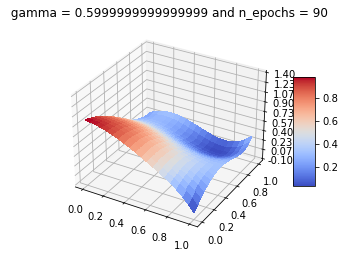

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


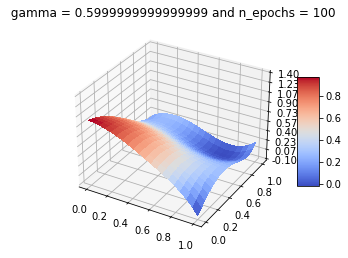

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


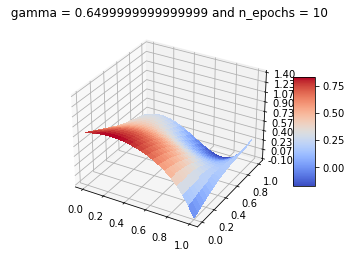

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


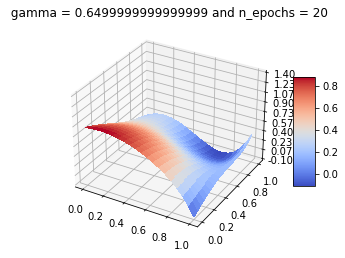

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


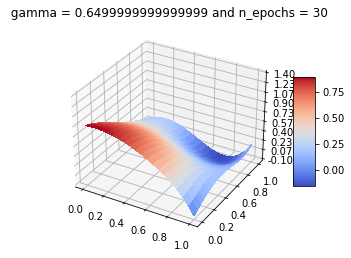

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


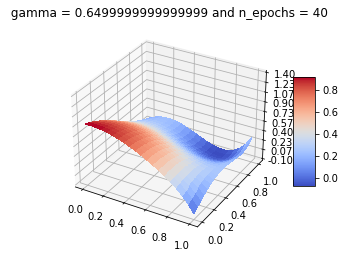

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


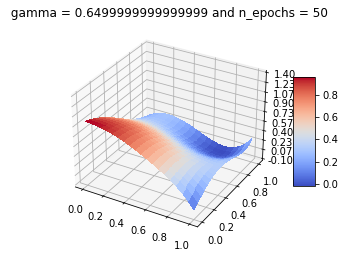

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


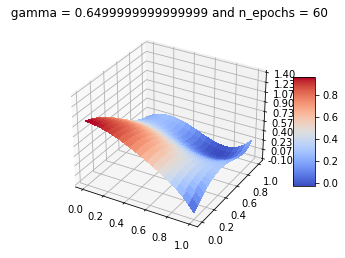

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


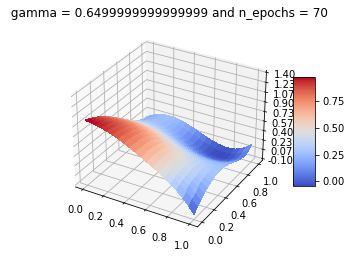

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


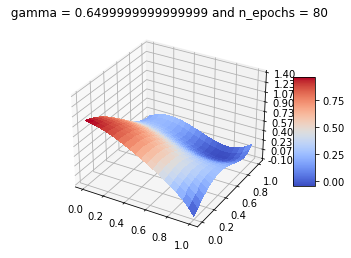

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


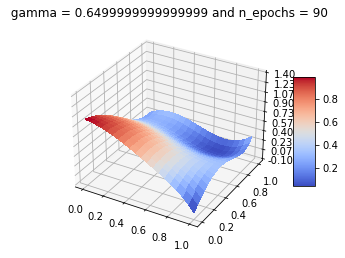

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


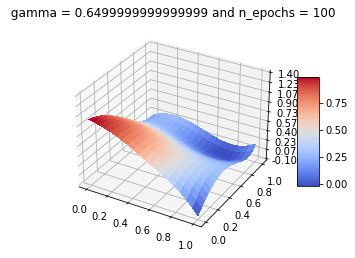

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


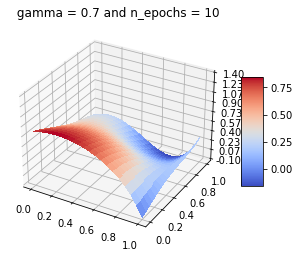

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


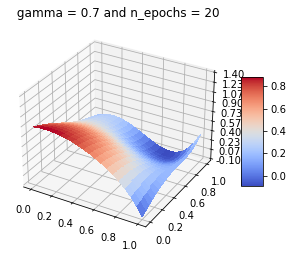

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


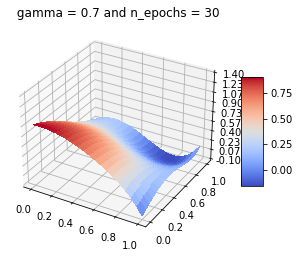

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


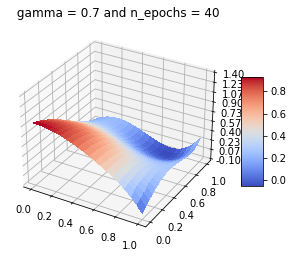

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


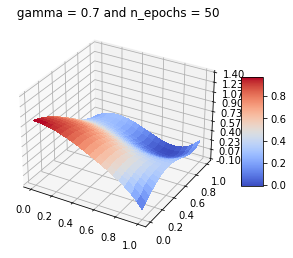

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


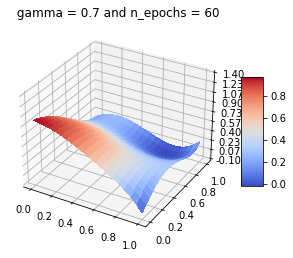

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


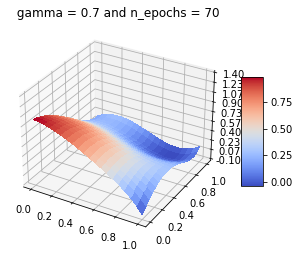

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


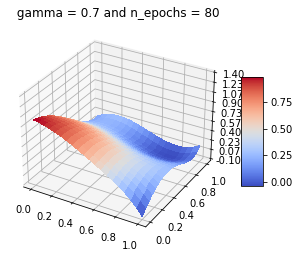

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


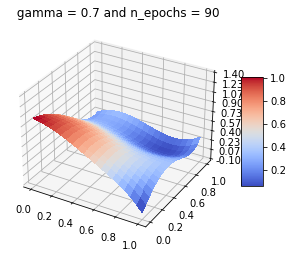

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


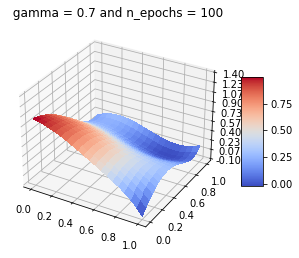

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


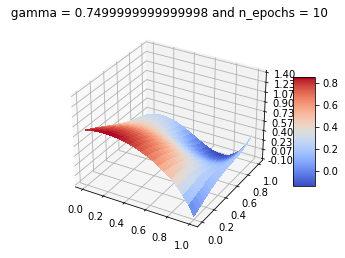

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


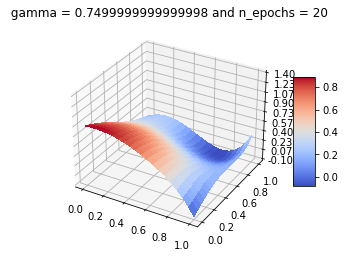

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


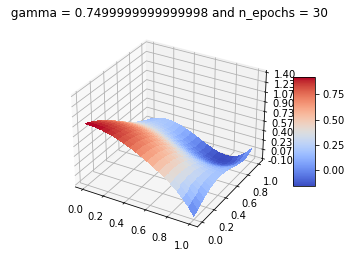

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


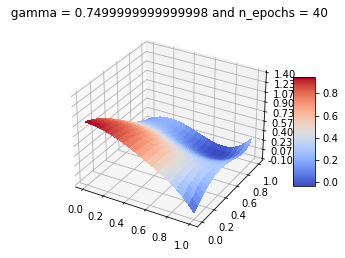

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


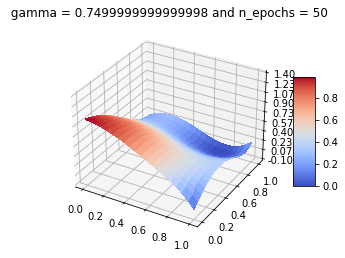

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


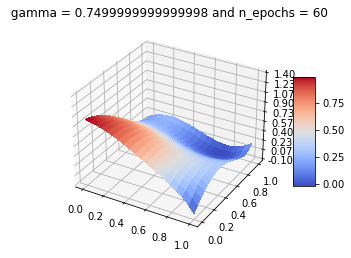

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


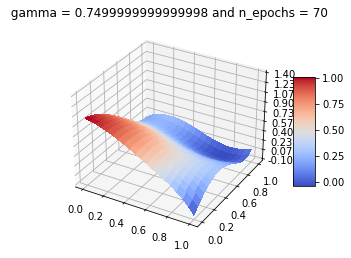

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


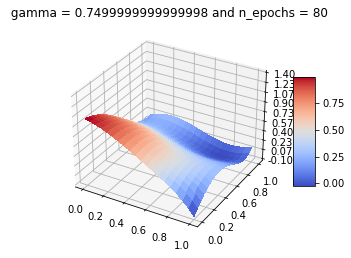

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


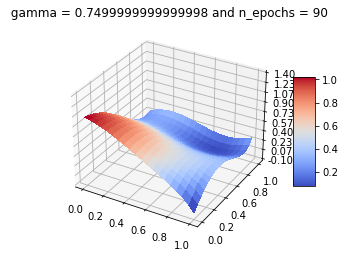

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


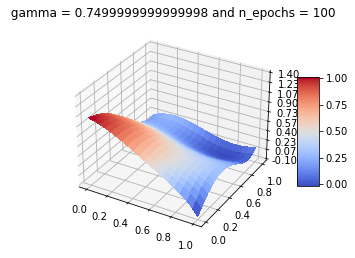

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


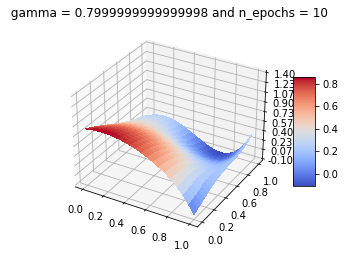

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


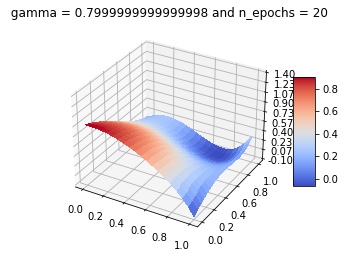

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


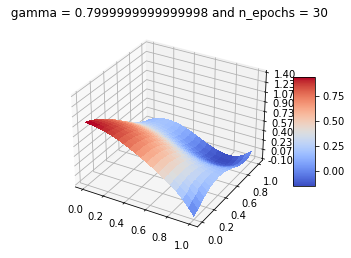

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


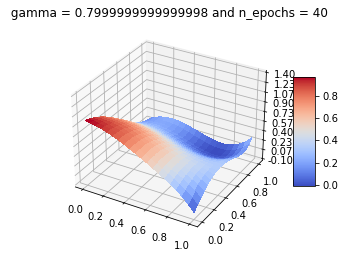

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


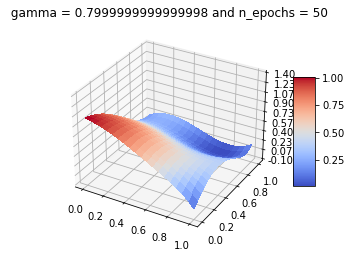

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


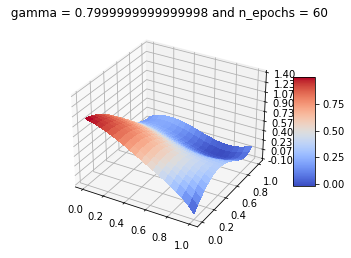

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


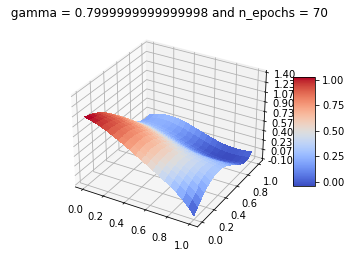

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


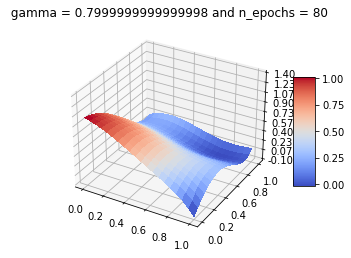

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


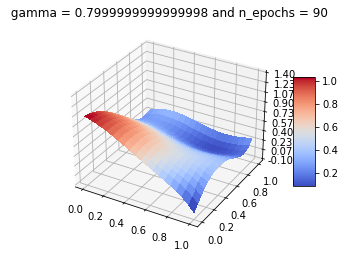

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


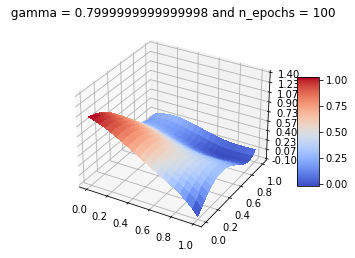

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


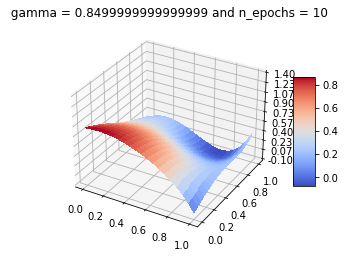

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


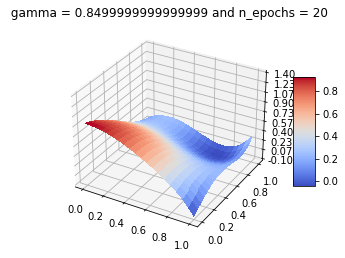

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


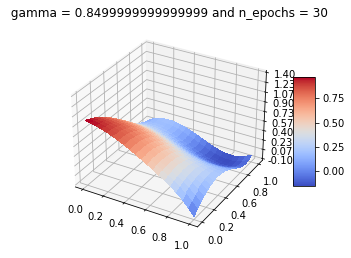

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


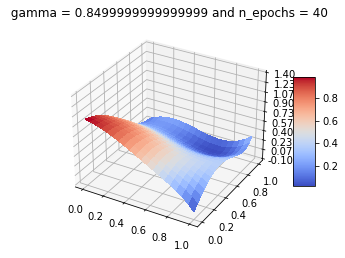

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


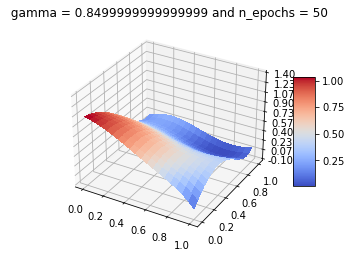

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


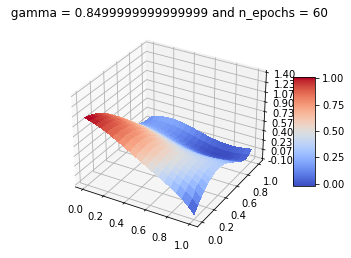

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


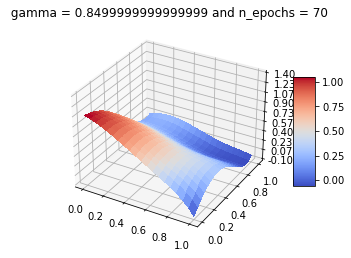

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


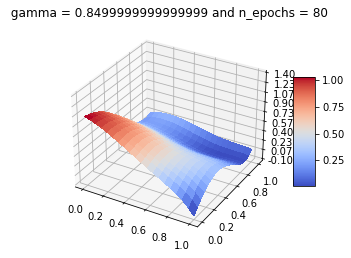

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


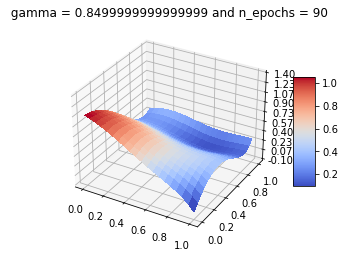

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


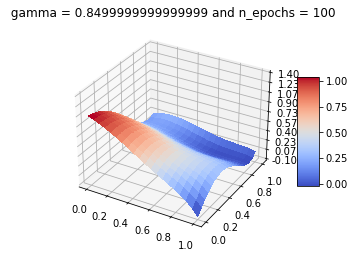

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


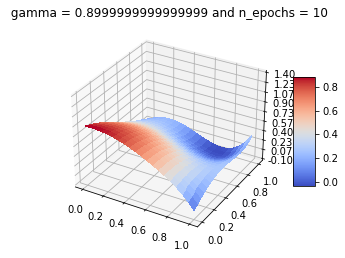

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


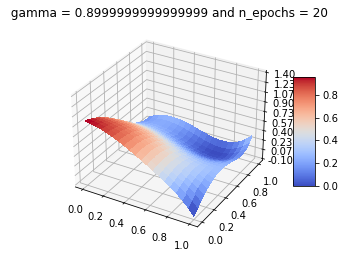

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


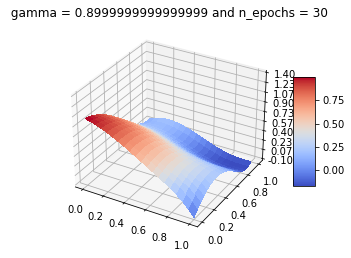

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


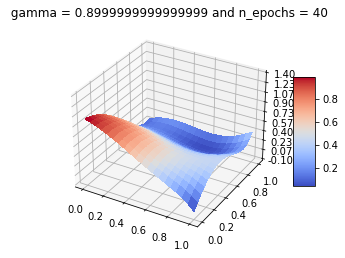

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


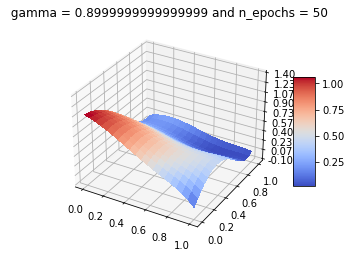

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


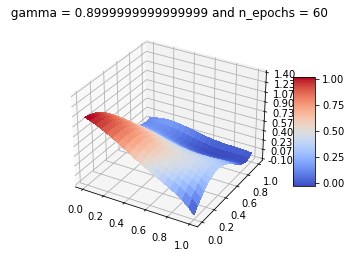

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


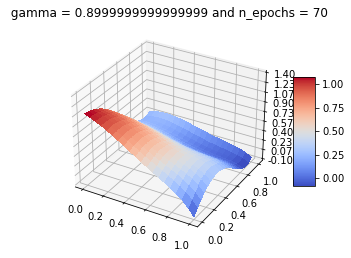

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


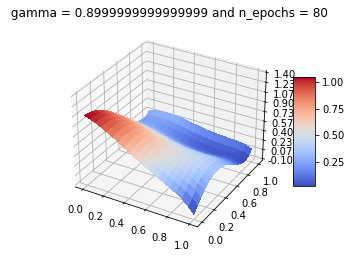

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


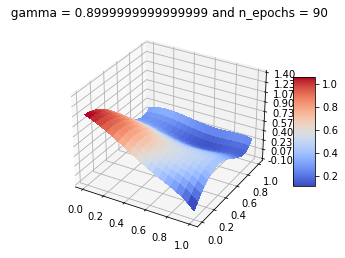

C:\Users\Lasse\AppData\Local\Temp/ipykernel_14292/2499924603.py:6: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


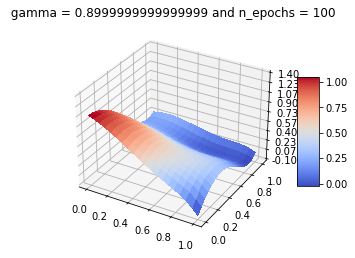

In [47]:
cost_score_Mom_epoch = np.zeros((len(gammas),len(n_epochs_list)))
learning_rates_Mom_epoch = np.zeros((len(gammas),len(n_epochs_list)))
mse_test_Mom_epoch = np.zeros((len(gammas),len(n_epochs_list)))
theta_j = 0
lr = 0

for i in range(len(gammas)):
    gamma = gammas[i]
    for j in range(len(n_epochs_list)):
        n_epochs = n_epochs_list[j]
        theta_j,lr = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,gamma = gamma,decay=1e-5)
        z_pred = X_test @ theta_j
        z_plot = X @theta_j
        z_plot = z_plot.reshape(z_mesh.shape)
        plot_z(x_mesh,y_mesh,z_plot, title = " gamma = {} and n_epochs = {}".format(gammas[i],n_epochs))
        mse_test_Mom_epoch[i,j] = mean_squared_error(z_test,z_pred)
        cost_score_Mom_epoch[i,j] = Cost_func_ols(z_train,X_train,theta_j)
        learning_rates_Mom_epoch[i,j] = lr

In [48]:
epoch_list = []
for i in range(len(n_epochs_list)):
    epoch_list.append("n_epochs={}".format(n_epochs_list[i]))
df_mse_heatmap_mom_epoch = pd.DataFrame(mse_test_Mom_epoch, index = gammas, columns = epoch_list)
df_mse_heatmap_mom_epoch

,n_epochs=10,n_epochs=20,n_epochs=30,n_epochs=40,n_epochs=50,n_epochs=60,n_epochs=70,n_epochs=80,n_epochs=90,n_epochs=100
0.20,0.043217,0.038127,0.036827,0.036583,0.034203,0.032897,0.032297,0.032046,0.031361,0.030308
0.25,0.042250,0.038096,0.036705,0.036328,0.033670,0.032382,0.031710,0.031505,0.030857,0.029764
0.30,0.041353,0.038075,0.036568,0.036008,0.033079,0.031826,0.031077,0.030925,0.030334,0.029197
0.35,0.040543,0.038050,0.036415,0.035612,0.032430,0.031227,0.030400,0.030306,0.029795,0.028609
0.40,0.039837,0.038001,0.036245,0.035123,0.031723,0.030585,0.029676,0.029645,0.029247,0.028001
0.45,0.039255,0.037904,0.036052,0.034526,0.030962,0.029901,0.028909,0.028943,0.028702,0.027377
0.50,0.038811,0.037725,0.035831,0.033806,0.030153,0.029178,0.028099,0.028200,0.028174,0.026743
0.55,0.038512,0.037424,0.035567,0.032950,0.029307,0.028420,0.027255,0.027419,0.027687,0.026106
0.60,0.038336,0.036954,0.035234,0.031951,0.028438,0.027635,0.026385,0.026608,0.027274,0.025479
0.65,0.038210,0.036267,0.034789,0.030822,0.027565,0.026837,0.025510,0.025778,0.026983,0.024881


<AxesSubplot:>

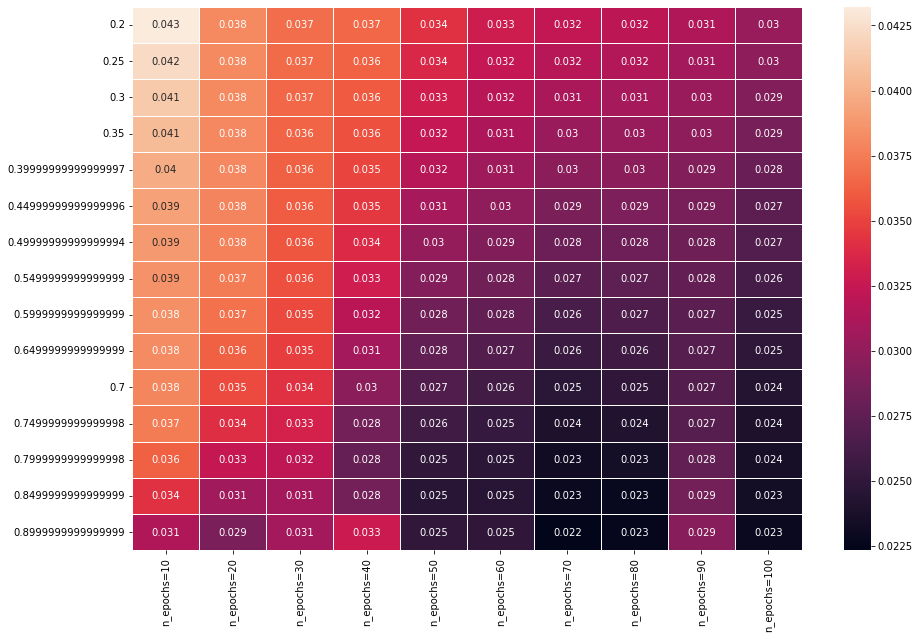

In [49]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_mom_epoch,annot =True, linewidths=.8, ax=ax,fmt='.2g')

# Doing similar things with Adagrad

In [34]:


cost_score_adg = np.zeros((len(deltas),len(n_epochs_list)))
learning_rates_adg = np.zeros((len(deltas),len(n_epochs_list)))
mse_test_adg = np.zeros((len(deltas),len(n_epochs_list)))
theta_j = 0
lr = 0

for i in range(len(deltas)):
    delta = deltas[i]
    for j in range(len(n_epochs_list)):
        n_epochs = n_epochs_list[j]
        theta_j = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = delta,algo = "ADG")

        z_pred = X_test @ theta_j
        #z_plot = X @theta_j

        #z_plot = z_plot.reshape(z_mesh.shape)
        #plot_z(x_mesh,y_mesh,z_plot, title = "delta={} and epocs = {}".format(deltas[i],n_epochs))
               
        mse_test_adg[i,j] = mean_squared_error(z_test,z_pred)
        cost_score_adg[i,j] = Cost_func_ols(z_test,X_test,theta_j)
        #learning_rates_adg[i,j] = lr


        
    

In [35]:
epoch_list = []
for i in range(len(n_epochs_list)):
    epoch_list.append("n_epochs={}".format(n_epochs_list[i]))
df_mse_heatmap_adg = pd.DataFrame(mse_test_adg, index = deltas, columns = epoch_list)
df_mse_heatmap_adg

,n_epochs=10,n_epochs=20,n_epochs=30,n_epochs=40,n_epochs=50,n_epochs=60,n_epochs=70,n_epochs=80,n_epochs=90,n_epochs=100
1.000000e-10,0.041278,0.045581,0.033898,0.028021,0.026361,0.029682,0.026496,0.027624,0.022927,0.022746
1.000000e-09,0.041278,0.045581,0.033898,0.028021,0.026361,0.029682,0.026496,0.027624,0.022927,0.022746
1.000000e-08,0.041278,0.045581,0.033898,0.028021,0.026361,0.029682,0.026496,0.027624,0.022927,0.022746
1.000000e-07,0.041278,0.045582,0.033898,0.028022,0.026361,0.029681,0.026495,0.027623,0.022927,0.022745
1.000000e-06,0.041276,0.045589,0.033899,0.028024,0.026364,0.029677,0.026484,0.027612,0.022921,0.022738
1.000000e-05,0.041257,0.045665,0.033910,0.028057,0.026388,0.029640,0.026402,0.027878,0.022657,0.019699


<AxesSubplot:>

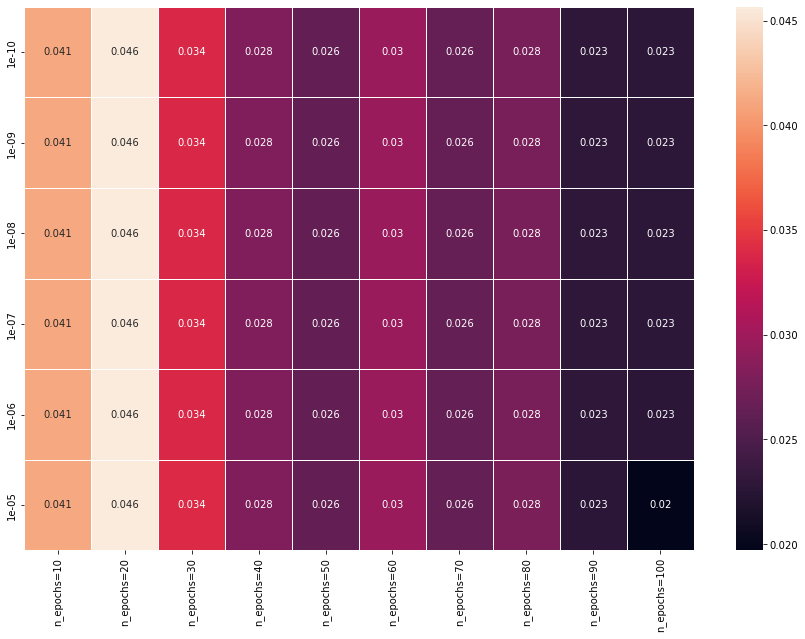

In [36]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_adg,annot =True, linewidths=.8, ax=ax,fmt='.2g')

# Similar things with RMS 

In [37]:

n_epochs_list = np.arange(10,110,10)


cost_score_rms = np.zeros((len(deltas),len(n_epochs_list)))
learning_rates_rms = np.zeros((len(deltas),len(n_epochs_list)))
mse_test_rms = np.zeros((len(deltas),len(n_epochs_list)))
theta_j = 0
lr = 0

for i in range(len(deltas)):
    delta = deltas[i]
    for j in range(len(n_epochs_list)):
        n_epochs = n_epochs_list[j]
        theta_j = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = delta,algo = "RMS")

        z_pred = X_test @ theta_j
        #z_plot = X @theta_j

        #z_plot = z_plot.reshape(z_mesh.shape)
        #plot_z(x_mesh,y_mesh,z_plot, title = "delta={} and epocs = {}".format(deltas[i],n_epochs))
               
        mse_test_rms[i,j] = mean_squared_error(z_test,z_pred)
        cost_score_rms[i,j] = Cost_func_ols(z_test,X_test,theta_j)
        #learning_rates_adg[i,j] = lr

    

In [38]:
epoch_list = []
for i in range(len(n_epochs_list)):
    epoch_list.append("n_epochs={}".format(n_epochs_list[i]))
df_mse_heatmap_rms = pd.DataFrame(mse_test_rms, index = deltas, columns = epoch_list)
df_mse_heatmap_rms

,n_epochs=10,n_epochs=20,n_epochs=30,n_epochs=40,n_epochs=50,n_epochs=60,n_epochs=70,n_epochs=80,n_epochs=90,n_epochs=100
1.000000e-10,0.041278,0.045581,0.033898,0.028021,0.026361,0.029682,0.026496,0.027624,0.022927,0.022746
1.000000e-09,0.041278,0.045581,0.033898,0.028021,0.026361,0.029682,0.026496,0.027624,0.022927,0.022746
1.000000e-08,0.041278,0.045581,0.033898,0.028021,0.026361,0.029682,0.026496,0.027624,0.022927,0.022746
1.000000e-07,0.041278,0.045582,0.033898,0.028022,0.026361,0.029681,0.026495,0.027623,0.022927,0.022745
1.000000e-06,0.041276,0.045589,0.033899,0.028024,0.026364,0.029677,0.026484,0.027612,0.022921,0.022738
1.000000e-05,0.041257,0.045665,0.033910,0.028057,0.026388,0.029640,0.026402,0.027878,0.022657,0.019699


<AxesSubplot:>

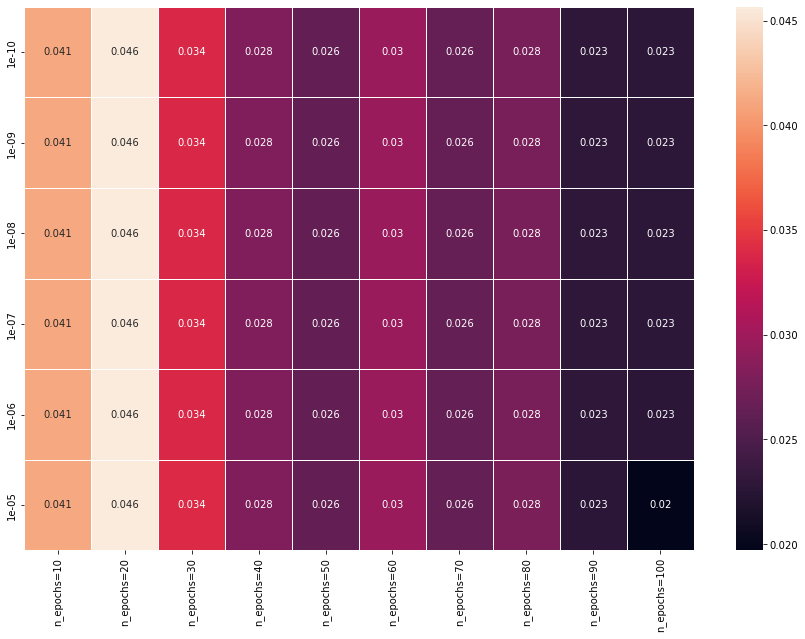

In [39]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_rms,annot =True, linewidths=.8, ax=ax,fmt='.2g')

# lastly it is done with ADAM

In [50]:
n_epochs_list = np.arange(10,110,10)


cost_score_adm = np.zeros((len(deltas),len(n_epochs_list)))
learning_rates_adm = np.zeros((len(deltas),len(n_epochs_list)))
mse_test_adm = np.zeros((len(deltas),len(n_epochs_list)))
theta_j = 0
lr = 0

for i in range(len(deltas)):
    delta = deltas[i]
    for j in range(len(n_epochs_list)):
        n_epochs = n_epochs_list[j]
        theta_j = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = delta,algo = "ADM")

        z_pred = X_test @ theta_j
        #z_plot = X @theta_j

        #z_plot = z_plot.reshape(z_mesh.shape)
        #plot_z(x_mesh,y_mesh,z_plot, title = "delta={} and epocs = {}".format(deltas[i],n_epochs))
               
        mse_test_adm[i,j] = mean_squared_error(z_test,z_pred)
        cost_score_adm[i,j] = Cost_func_ols(z_test,X_test,theta_j)
        #learning_rates_adg[i,j] = lr


In [51]:
epoch_list = []
for i in range(len(n_epochs_list)):
    epoch_list.append("n_epochs={}".format(n_epochs_list[i]))
df_mse_heatmap_adm = pd.DataFrame(mse_test_adm, index = deltas, columns = epoch_list)
df_mse_heatmap_adm

,n_epochs=10,n_epochs=20,n_epochs=30,n_epochs=40,n_epochs=50,n_epochs=60,n_epochs=70,n_epochs=80,n_epochs=90,n_epochs=100
1.000000e-10,0.039386,0.032694,0.036384,0.032538,0.034138,0.025746,0.026127,0.022202,0.040378,0.046327
1.000000e-09,0.039386,0.032694,0.036384,0.032538,0.034138,0.025746,0.026127,0.022202,0.040378,0.046327
1.000000e-08,0.039386,0.032694,0.036384,0.032538,0.034138,0.025746,0.026127,0.022202,0.040378,0.046327
1.000000e-07,0.039386,0.032694,0.036384,0.032538,0.034138,0.025746,0.026127,0.022202,0.040378,0.046327
1.000000e-06,0.039386,0.032694,0.036384,0.032538,0.034138,0.025746,0.026130,0.022202,0.040378,0.046327
1.000000e-05,0.039383,0.032693,0.036382,0.032538,0.034133,0.025749,0.026154,0.022201,0.040378,0.046325


<AxesSubplot:>

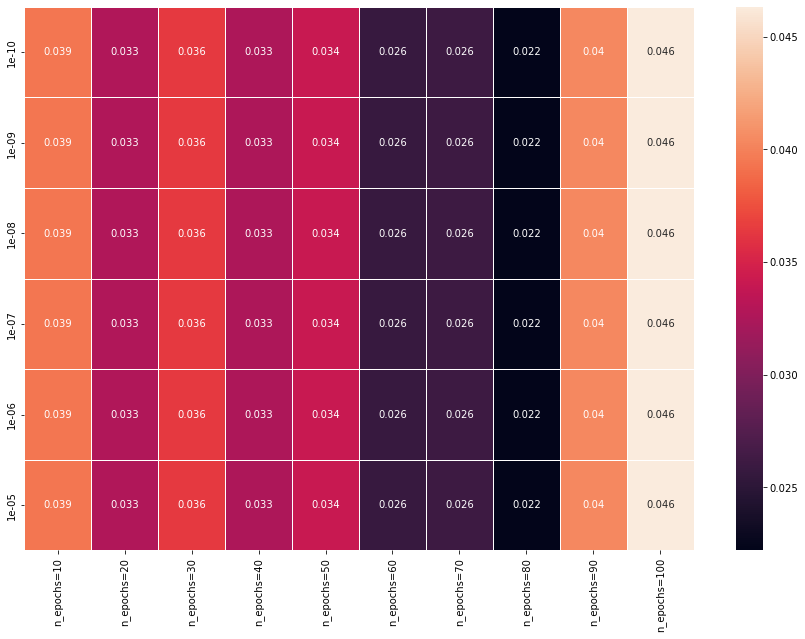

In [52]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_adm,annot =True, linewidths=.8, ax=ax,fmt='.2g')

# The question now is how much does initial learning rate affect the MSE.

Testing MSE with n_epochs and initial learning rates, setting delta = 1-e5 and gamma = 0.9 and decay = 1e-5

In [40]:

n_epochs_list = np.arange(10,110,10)
etas = np.logspace(-5,-1,5)
mse_test_mom_eta = np.zeros((len(etas),len(n_epochs_list)))
mse_test_adg_eta = np.zeros((len(etas),len(n_epochs_list)))
mse_test_rms_eta = np.zeros((len(etas),len(n_epochs_list)))
mse_test_adm_eta = np.zeros((len(etas),len(n_epochs_list)))
theta_j = 0
lr = 0
for i in range(len(etas)):
    eta = etas[i]
    for j in range(len(n_epochs_list)):
        n_epochs = n_epochs_list[j]
        theta_rms = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "RMS", eta = eta)
        theta_mom,lr = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,decay = 1e-5,gamma = 0.9,algo = "MOM",eta=eta)
        theta_adg = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "ADG",eta=eta)
        theta_adm = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "ADM",eta=eta)



        z_pred_mom = X_test @ theta_mom
        z_pred_rms = X_test @ theta_rms
        z_pred_adg = X_test @ theta_adg
        z_pred_adm = X_test @ theta_adm

               
        mse_test_rms_eta[i,j] = mean_squared_error(z_test,z_pred_rms)
        mse_test_mom_eta[i,j] = mean_squared_error(z_test,z_pred_mom)
        mse_test_adg_eta[i,j] = mean_squared_error(z_test,z_pred_adg)
        mse_test_adm_eta[i,j] = mean_squared_error(z_test,z_pred_adm)


    

In [41]:
epoch_list = []
for i in range(len(n_epochs_list)):
    epoch_list.append("n_epochs={}".format(n_epochs_list[i]))
df_mse_heatmap_rms_eta = pd.DataFrame(mse_test_rms_eta, index = etas, columns = epoch_list)
df_mse_heatmap_mom_eta = pd.DataFrame(mse_test_mom_eta, index = etas, columns = epoch_list)
df_mse_heatmap_adg_eta = pd.DataFrame(mse_test_adg_eta, index = etas, columns = epoch_list)
df_mse_heatmap_adm_eta = pd.DataFrame(mse_test_adm_eta, index = etas, columns = epoch_list)
df_mse_heatmap_rms_eta

,n_epochs=10,n_epochs=20,n_epochs=30,n_epochs=40,n_epochs=50,n_epochs=60,n_epochs=70,n_epochs=80,n_epochs=90,n_epochs=100
0.00001,5.815753,5.801665,5.787010,5.772355,5.757975,5.743563,5.729466,5.715414,5.701028,5.687141
0.00010,5.682832,5.548954,5.413296,5.281787,5.157280,5.036820,4.922444,4.811181,4.701266,4.597869
0.00100,4.571841,3.730165,3.033308,2.473703,2.015122,1.615978,1.297632,1.023338,0.792015,0.618068
0.01000,0.668658,0.236478,0.124769,0.067559,0.043237,0.036822,0.037154,0.035820,0.035483,0.032717
0.10000,0.041257,0.045665,0.033910,0.028057,0.026388,0.029640,0.026402,0.027878,0.022657,0.019699


Text(0.5, 1.0, 'RMS MSE initial learning rate and number of epochs')

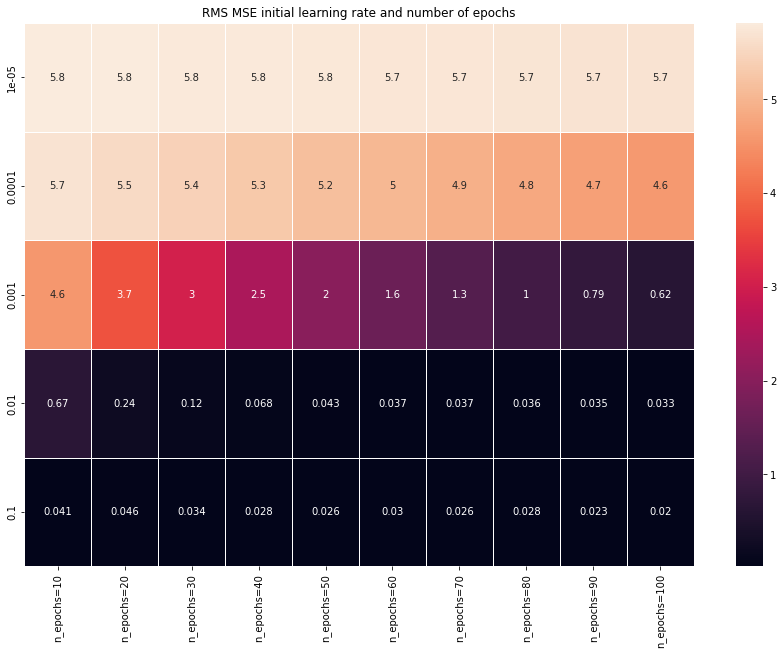

In [42]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_rms_eta,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("RMS MSE initial learning rate and number of epochs")

Text(0.5, 1.0, 'Adagrad MSE initial learning rate and number of epochs')

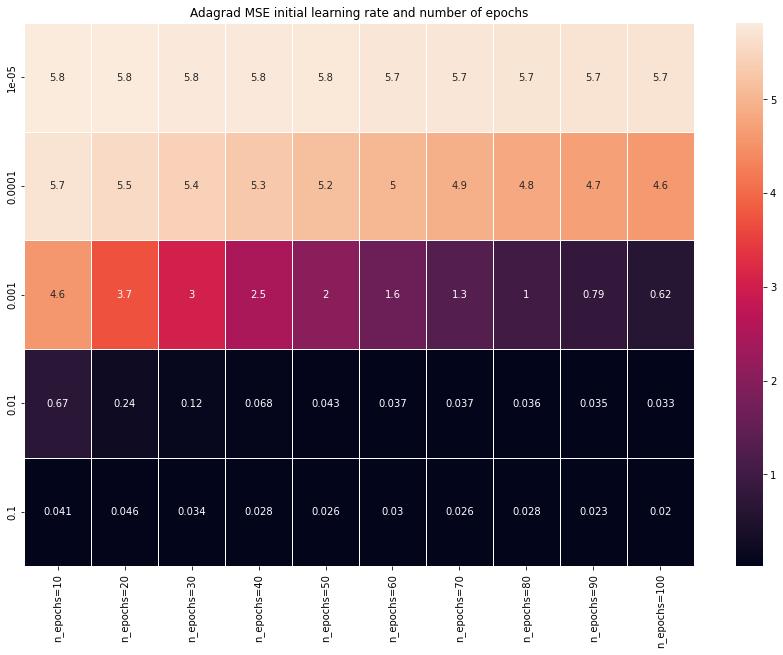

In [43]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_adg_eta,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("Adagrad MSE initial learning rate and number of epochs")

Text(0.5, 1.0, 'momentum MSE initial learning rate and number of epochs')

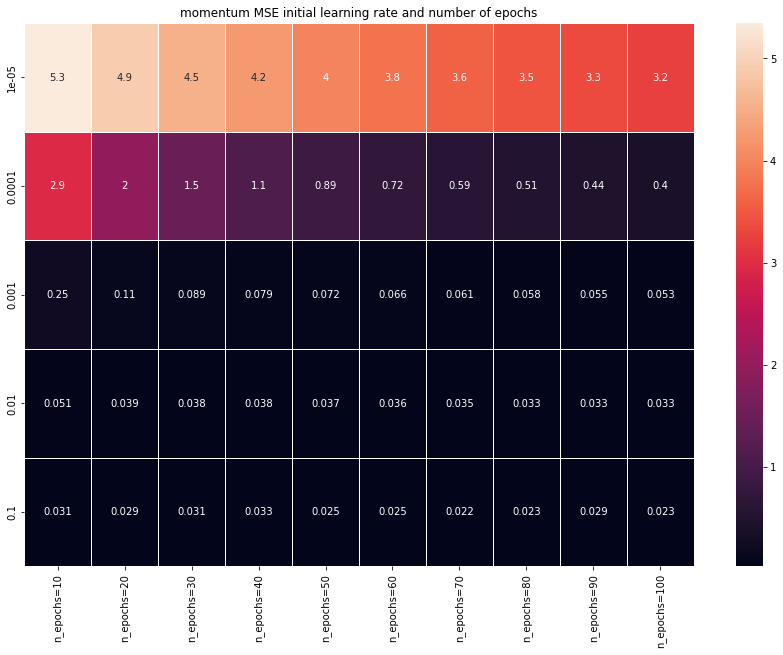

In [44]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_mom_eta,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("momentum MSE initial learning rate and number of epochs")

Text(0.5, 1.0, 'Adam MSE initial learning rate and number of epochs')

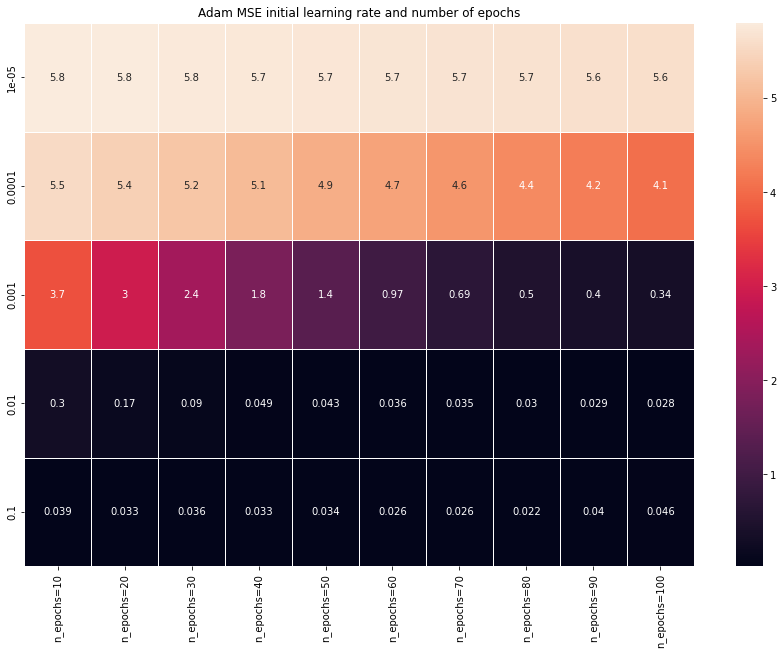

In [45]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_adm_eta,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("Adam MSE initial learning rate and number of epochs")

Adam seems to have best initial learning rate at 0.01

From all the different algorithms it is clear that an initial learningrate of 0.1 is prefered except adam where it is 0.01

In [54]:
#n_epochs_list = np.arange(10,110,10)
etas = np.logspace(-5,-1,5)
mse_test_mom_comp = []
mse_test_adg_comp = []
mse_test_rms_comp = []
mse_test_adm_comp = []


r2_test_mom_comp = []
r2_test_adg_comp = []
r2_test_rms_comp = []
r2_test_adm_comp = []
theta_j = 0
lr = 0
batch_size = 10
#n_epochs = 40
gammas = np.arange(0.2,0.95,0.05)
decays = np.logspace(-6,-1,6)
deltas = np.logspace(-10,-5,6)
n_epochs_list = np.arange(10,110,10)

for j in range(101):
    n_epochs = j
    theta_rms = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "RMS", eta = 0.1)
    theta_mom,lr = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,decay = 1e-5,gamma = 0.9,algo = "MOM",eta=0.1)
    theta_adg = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "ADG",eta=0.1)
    theta_adm = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "ADM",eta=0.01)




    z_pred_mom = X_test @ theta_mom
    z_pred_rms = X_test @ theta_rms
    z_pred_adg = X_test @ theta_adg
    z_pred_adm = X_test @ theta_adm

               
    mse_test_rms_comp.append(mean_squared_error(z_test,z_pred_rms))
    mse_test_mom_comp.append(mean_squared_error(z_test,z_pred_mom))
    mse_test_adg_comp.append(mean_squared_error(z_test,z_pred_adg))
    mse_test_adm_comp.append(mean_squared_error(z_test,z_pred_adm))
    
    r2_test_rms_comp.append(r2_score(z_test,z_pred_rms))
    r2_test_mom_comp.append(r2_score(z_test,z_pred_mom))
    r2_test_adg_comp.append(r2_score(z_test,z_pred_adg))
    r2_test_adm_comp.append(r2_score(z_test,z_pred_adm))



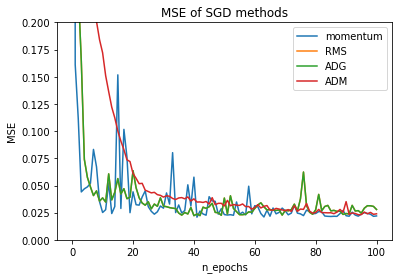

In [59]:
plt.plot(np.arange(0,101,1), mse_test_mom_comp, label='momentum')
plt.plot(np.arange(0,101,1), mse_test_rms_comp, label='RMS')
plt.plot(np.arange(0,101,1), mse_test_adg_comp, label='ADG')
plt.plot(np.arange(0,101,1), mse_test_adm_comp, label='ADM')
plt.legend()
plt.xlabel("n_epochs")
plt.ylabel("MSE")
plt.ylim(0,0.2)
plt.title("MSE of SGD methods")
plt.show()



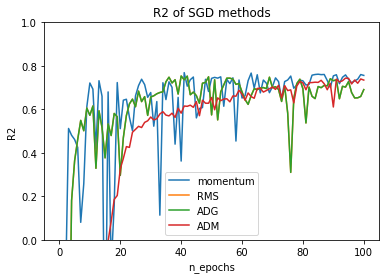

In [67]:
plt.plot(np.arange(0,101,1), r2_test_mom_comp, label='momentum')
plt.plot(np.arange(0,101,1), r2_test_rms_comp, label='RMS')
plt.plot(np.arange(0,101,1), r2_test_adg_comp, label='ADG')
plt.plot(np.arange(0,101,1), r2_test_adm_comp, label='ADM')
plt.legend()
plt.xlabel("n_epochs")
plt.ylabel("R2")
plt.ylim(0,1)
plt.title("R2 of SGD methods")
plt.show()



# Final comparison of batch size and number of epochs

In [61]:
n_epochs_list = np.arange(10,110,10)
batch_sizes = [10,16,20,32,40,64,80]
mse_test_mom_size = np.zeros((len(batch_sizes),len(n_epochs_list)))
mse_test_adg_size = np.zeros((len(batch_sizes),len(n_epochs_list)))
mse_test_rms_size = np.zeros((len(batch_sizes),len(n_epochs_list)))
mse_test_adm_size = np.zeros((len(batch_sizes),len(n_epochs_list)))
theta_j = 0
lr = 0
for i in range(len(batch_sizes)):
    batch_size = batch_sizes[i]
    for j in range(len(n_epochs_list)):
        n_epochs = n_epochs_list[j]
        theta_rms = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "RMS", eta = 0.1)
        theta_mom,lr = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,decay = 1e-5,gamma = 0.9,algo = "MOM",eta=0.1)
        theta_adg = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "ADG",eta=0.1)
        theta_adm = SGD_OLS(X_train,z_train,n_epochs = n_epochs,batch_size = batch_size,delta = 1e-5,algo = "ADM",eta=0.01)



        z_pred_mom = X_test @ theta_mom
        z_pred_rms = X_test @ theta_rms
        z_pred_adg = X_test @ theta_adg
        z_pred_adm = X_test @ theta_adm

               
        mse_test_rms_size[i,j] = mean_squared_error(z_test,z_pred_rms)
        mse_test_mom_size[i,j] = mean_squared_error(z_test,z_pred_mom)
        mse_test_adg_size[i,j] = mean_squared_error(z_test,z_pred_adg)
        mse_test_adm_size[i,j] = mean_squared_error(z_test,z_pred_adm)



In [62]:
epoch_list = []
num_minibatch = []
for i in range(len(n_epochs_list)):
    epoch_list.append("n_epochs={}".format(n_epochs_list[i]))
for i in range(len(batch_sizes)):
    num_minibatch.append("mini_batches = {}".format(int(320/batch_sizes[i])))
    
df_mse_heatmap_rms_size = pd.DataFrame(mse_test_rms_size, index = num_minibatch, columns = epoch_list)
df_mse_heatmap_mom_size = pd.DataFrame(mse_test_mom_size, index = num_minibatch, columns = epoch_list)
df_mse_heatmap_adg_size = pd.DataFrame(mse_test_adg_size, index = num_minibatch, columns = epoch_list)
df_mse_heatmap_adm_size = pd.DataFrame(mse_test_adm_size, index = num_minibatch, columns = epoch_list)
df_mse_heatmap_rms_size

,n_epochs=10,n_epochs=20,n_epochs=30,n_epochs=40,n_epochs=50,n_epochs=60,n_epochs=70,n_epochs=80,n_epochs=90,n_epochs=100
mini_batches = 32,0.038651,0.063658,0.031045,0.022295,0.038493,0.028934,0.027143,0.027619,0.024255,0.027964
mini_batches = 20,0.051718,0.087962,0.032450,0.029443,0.025375,0.021359,0.028422,0.025536,0.022110,0.023093
mini_batches = 16,0.041257,0.045665,0.033910,0.028057,0.026388,0.029640,0.026402,0.027878,0.022657,0.019699
mini_batches = 10,0.051298,0.043774,0.048889,0.049180,0.033434,0.073408,0.041234,0.025668,0.024096,0.026850
mini_batches = 8,0.074258,0.054236,0.041051,0.046905,0.043362,0.033097,0.027523,0.026659,0.021004,0.025825
mini_batches = 5,0.088516,0.037209,0.051497,0.031615,0.041546,0.068091,0.028909,0.034957,0.029045,0.031985
mini_batches = 4,0.160505,0.125892,0.046996,0.044180,0.031107,0.136521,0.043249,0.048444,0.035034,0.023650


Text(0.5, 1.0, 'Adagrad MSE number of mini batches and epochs')

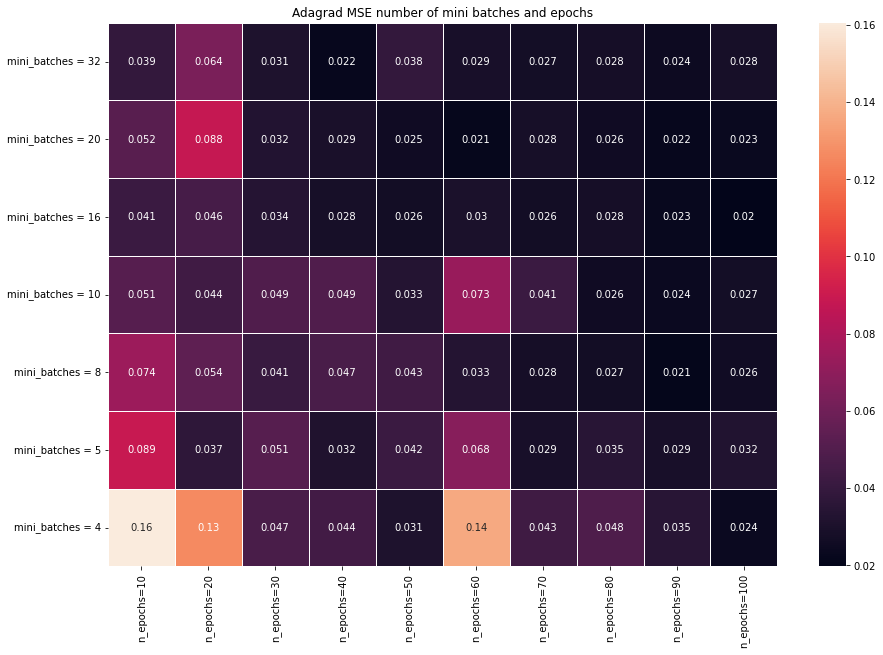

In [63]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_adg_size,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("Adagrad MSE number of mini batches and epochs")

Text(0.5, 1.0, 'momentum MSE number of mini batches and epochs')

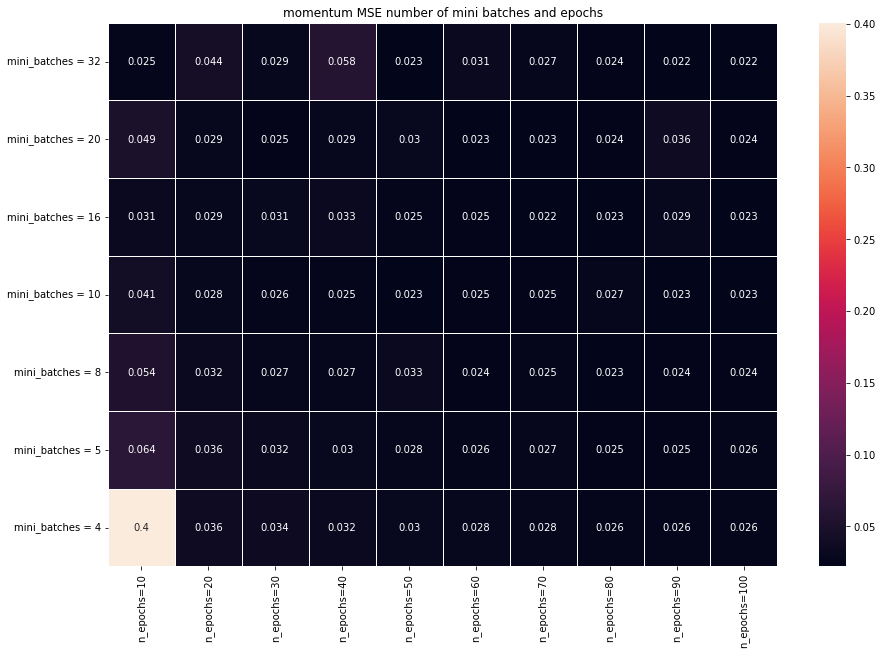

In [64]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_mom_size,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("momentum MSE number of mini batches and epochs")

Text(0.5, 1.0, 'RMS MSE number of mini batches and epochs')

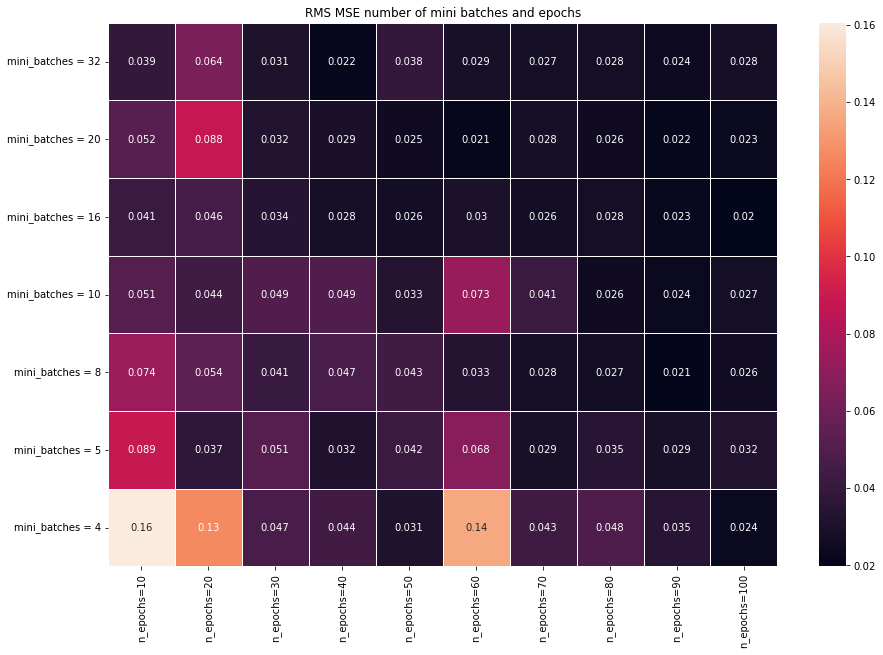

In [65]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_rms_size,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("RMS MSE number of mini batches and epochs")

Text(0.5, 1.0, 'ADAM MSE number of mini batches and epochs')

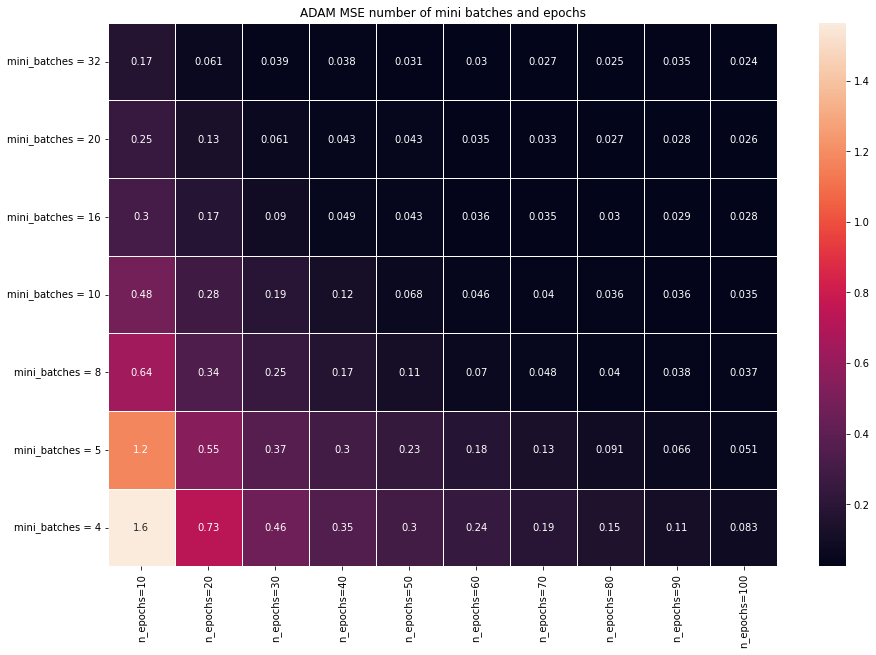

In [66]:
fig, ax = plt.subplots(figsize=(15,10))   
sns.heatmap(df_mse_heatmap_adm_size,annot =True, linewidths=.8, ax=ax,fmt='.2g')
ax.set_title("ADAM MSE number of mini batches and epochs")

# Testing Grounds Just testing different syntaxes and packages, and comfirmiation of belief

In [169]:
a = np.linspace(0,1,40)
print(a)
a = a.reshape(-1,1)
print(a.shape)
a = a.reshape(-1,2)
print(a)

print(a.shape)
print(len(a.shape))

[0.         0.02564103 0.05128205 0.07692308 0.1025641  0.12820513
 0.15384615 0.17948718 0.20512821 0.23076923 0.25641026 0.28205128
 0.30769231 0.33333333 0.35897436 0.38461538 0.41025641 0.43589744
 0.46153846 0.48717949 0.51282051 0.53846154 0.56410256 0.58974359
 0.61538462 0.64102564 0.66666667 0.69230769 0.71794872 0.74358974
 0.76923077 0.79487179 0.82051282 0.84615385 0.87179487 0.8974359
 0.92307692 0.94871795 0.97435897 1.        ]
(40, 1)
[[0.         0.02564103]
 [0.05128205 0.07692308]
 [0.1025641  0.12820513]
 [0.15384615 0.17948718]
 [0.20512821 0.23076923]
 [0.25641026 0.28205128]
 [0.30769231 0.33333333]
 [0.35897436 0.38461538]
 [0.41025641 0.43589744]
 [0.46153846 0.48717949]
 [0.51282051 0.53846154]
 [0.56410256 0.58974359]
 [0.61538462 0.64102564]
 [0.66666667 0.69230769]
 [0.71794872 0.74358974]
 [0.76923077 0.79487179]
 [0.82051282 0.84615385]
 [0.87179487 0.8974359 ]
 [0.92307692 0.94871795]
 [0.97435897 1.        ]]
(20, 2)
2


In [60]:
beta = np.random.randn(a.shape[1]) # Picking out initial beta values
print(beta)

[1.71348898]


In [99]:
b = np.linspace(0,1,20)
b = b.reshape(-1,1)

c = np.hstack((a,b.reshape(-1,1)))
print(len(c.shape))

2


In [168]:
n = 6
m = c.shape[0]//n
things = []
i = 0
for i in range(m):
    thingy = c[ i * n : (i+1) * n,:]
    a_mini = thingy[:,:-1]
    b_mini = thingy[:,-1]
    things.append((a_mini,b_mini))
if c.shape[0] % n != 0 :
    thingy = c[ i *n : c.shape[0]]
    a_mini = thingy[:,:-1]
    b_mini = thingy[:,-1]
    things.append((a_mini,b_mini))
    print(i)
print(len(things))
#print(np.shape(things))

2
4


In [196]:
20//3

6

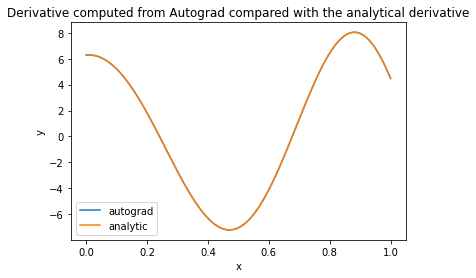

The max absolute difference is: 1.77636e-15


In [71]:
import autograd.numpy as np

# To do elementwise differentiation:
from autograd import elementwise_grad as egrad 

# To plot:
import matplotlib.pyplot as plt 


def e(x):
    return np.sin(2*np.pi*x + x**2)

def f_grad_analytic(x):
    return np.cos(2*np.pi*x + x**2)*(2*np.pi + 2*x)

# Do the comparison:
x = np.linspace(0,1,1000)

f_grad = egrad(e)

computed = f_grad(x)
analytic = f_grad_analytic(x)

plt.title('Derivative computed from Autograd compared with the analytical derivative')
plt.plot(x,computed,label='autograd')
plt.plot(x,analytic,label='analytic')

plt.xlabel('x')
plt.ylabel('y')
plt.legend()

plt.show()

print("The max absolute difference is: %g"%(np.max(np.abs(computed - analytic))))

In [138]:
x = np.random.rand(20,1)
A = np.c_[np.ones((20,1)), x, x*x]
print(A)

[[1.         0.36780243 0.13527863]
 [1.         0.59756275 0.35708124]
 [1.         0.62782463 0.39416377]
 [1.         0.74550468 0.55577722]
 [1.         0.06878019 0.00473071]
 [1.         0.36210568 0.13112052]
 [1.         0.52141565 0.27187428]
 [1.         0.72324996 0.52309051]
 [1.         0.30785034 0.09477183]
 [1.         0.17695468 0.03131296]
 [1.         0.08783843 0.00771559]
 [1.         0.11505986 0.01323877]
 [1.         0.50714156 0.25719256]
 [1.         0.09607387 0.00923019]
 [1.         0.83714762 0.70081614]
 [1.         0.73848699 0.54536303]
 [1.         0.34769336 0.12089067]
 [1.         0.94547035 0.89391418]
 [1.         0.63291773 0.40058486]
 [1.         0.0888901  0.00790145]]


In [59]:
# Using Autograd to calculate gradients using AdaGrad and Stochastic Gradient descent
# OLS example
from random import random, seed
import numpy as np
import autograd.numpy as np
import matplotlib.pyplot as plt
from autograd import grad

# Note change from previous example
def CostOLS(y,X,theta):
    return np.sum((y-X @ theta)**2)

n = 320
x = np.random.rand(n,1)
y = 2.0+3*x +4*x*x# +np.random.randn(n,1)

X = np.c_[np.ones((n,1)), x, x*x]
XT_X = X.T @ X
theta_linreg = np.linalg.pinv(XT_X) @ (X.T @ y)
print("Own inversion")
print(theta_linreg)


# Note that we request the derivative wrt third argument (theta, 2 here)
training_gradient = grad(CostOLS,2)
# Define parameters for Stochastic Gradient Descent
n_epochs = 5
M =  3  #size of each minibatch
m = int(n/M) #number of minibatches
# Guess for unknown parameters theta
theta = np.random.randn(3,1)

# Value for learning rate
eta = 0.01
# Including AdaGrad parameter to avoid possible division by zero
delta  = 1e-8
for epoch in range(n_epochs):
    # The outer product is calculated from scratch for each epoch
    Giter = np.zeros(shape=(3,3))
    for i in range(m):
        random_index = M*np.random.randint(m)
        xi = X[random_index:random_index+M]
        yi = y[random_index:random_index+M]
        gradients = (1.0/M)*training_gradient(yi, xi, theta)
	# Calculate the outer product of the gradients
        Giter +=gradients @ gradients.T
	# Simpler algorithm with only diagonal elements
        Ginverse = np.c_[eta/(delta+np.sqrt(np.diagonal(Giter)))]
        # compute update
        update = np.multiply(Ginverse,gradients)
        theta -= update
        print(Ginverse.shape)
print("theta from own AdaGrad")
print(theta.shape)

Own inversion
[[2.]
 [3.]
 [4.]]
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(3, 1)
(